### Описание набора данных

| Column Name                            | Description                                               |
|----------------------------------------|-----------------------------------------------------------|
| FORCE_2020_LITHOFACIES_CONFIDENCE     | Qualitative measure of interpretation confidence          |
| FORCE_2020_LITHOFACIES_LITHOLOGY      | Interpreted Lithofacies                                   |
| RDEP                                   | Deep Reading Resistivity measurement                      |
| RSHA                                   | Shallow Reading Resistivity measurement                   |
| RMED                                   | Medium Deep Reading Resistivity measurement               |
| RXO                                    | Flushed Zone Resistivity measurement                      |
| RMIC                                   | Micro Resistivity measurement                             |
| SP                                     | Self Potential Log                                        |
| DTS                                    | Shear wave sonic log (us/ft)                              |
| DTC                                    | Compressional waves sonic log (us/ft)                     |
| NPHI                                   | Neutron Porosity log                                      |
| PEF                                    | Photo Electric Factor log                                 |
| GR                                     | Gamma Ray Log                                             |
| RHOB                                   | Bulk Density Log                                          |
| DRHO                                   | Density Correction log                                    |
| CALI                                   | Caliper log                                               |
| BS                                     | Borehole Size                                             |
| DCAL                                   | Differential Caliper log                                  |
| ROPA                                   | Average Rate of Penetration                               |
| SGR                                    | Spectra Gamma Ray log                                     |
| MUDWEIGHT                              | Weight of Drilling Mud                                    |
| ROP                                    | Rate of Penetration                                       |
| DEPTH_MD                               | Measured Depth                                            |
| x_loc                                  | X location of sample                                      |
| y_loc                                  | Y location of sample                                      |
| z_loc                                  | Z (TVDSS) Depth of sample                                 |


Данные содержат столбцы метаданных:
* WELL: название скважины
* DEPTH_MD: измеренная глубина
* X_LOC: UTM координата X
* Y_LOC: UTM координата Y
* Z_LOC: ГЛУБИНА
* GROUP: группа литостратиграфии NPD
* FORMATION: формация литостратиграфии NPD

Данные содержат кривые каротажа скважины. Например, следующие:
* BS: Размер бита
* CALI: Калипер
* RDEP: Глубокое сопротивление
* RHOB: Объемная плотность
* GR: Сырые данные гамма-излучения
* SGR: Спектральный гамма-излучение
* RMED: Среднее сопротивление
* ROP: Скорость бурения
* NPHI: Нейтронная пористость
* PEF: Фотоэлектрический коэффициент поглощения
* RSHA: Поверхностное сопротивление
* DTS: Звуковая скорость (поперечная)
* DTC: Звуковая скорость (компрессионная)

а также интерпретацию

* FORCE_2020_LITHOFACIES_LITHOLOGY: классификация литологии
* FORCE_2020_LITHOFACIES_CONFIDENCE: уверенность в интерпретации литологии (1: высокая, 2: средняя, 3: низкая)

### 1. Установка библиотек и загрузка данных

In [230]:
import joblib
import warnings
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import xgboost as xgb
from numpy import std
from numpy import mean
import lightgbm as lgbm
import plotly.express as px
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
import matplotlib.colors as colors
from sklearn.metrics import f1_score
from pandas import DataFrame, Series
from scipy.ndimage import median_filter
from catboost import CatBoostClassifier
from sklearn.metrics import recall_score
from sklearn.impute import SimpleImputer
from sklearn.model_selection import KFold
from sklearn.metrics import jaccard_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder 
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import plot_tree, export_text
from sklearn.preprocessing import OrdinalEncoder
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import fbeta_score, make_scorer
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import classification_report


sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (20, 16)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [2]:
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [3]:
df = pd.read_csv('../data/Vovle/CSV_train.csv', sep=';')

In [4]:
df.head()

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RSHA,RMED,...,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE
0,15/9-13,494.528,437641.96875,6470972.5,-469.501831,NORDLAND GP.,NaN,19.480835,NaN,1.611410,...,34.636410,NaN,NaN,-0.574928,NaN,NaN,NaN,NaN,65000,1.0
1,15/9-13,494.680,437641.96875,6470972.5,-469.653809,NORDLAND GP.,NaN,19.468800,NaN,1.618070,...,34.636410,NaN,NaN,-0.570188,NaN,NaN,NaN,NaN,65000,1.0
2,15/9-13,494.832,437641.96875,6470972.5,-469.805786,NORDLAND GP.,NaN,19.468800,NaN,1.626459,...,34.779556,NaN,NaN,-0.574245,NaN,NaN,NaN,NaN,65000,1.0
3,15/9-13,494.984,437641.96875,6470972.5,-469.957794,NORDLAND GP.,NaN,19.459282,NaN,1.621594,...,39.965164,NaN,NaN,-0.586315,NaN,NaN,NaN,NaN,65000,1.0
4,15/9-13,495.136,437641.96875,6470972.5,-470.109772,NORDLAND GP.,NaN,19.453100,NaN,1.602679,...,57.483765,NaN,NaN,-0.597914,NaN,NaN,NaN,NaN,65000,1.0


In [5]:
columns_rows = df.shape

In [6]:
print('Количество столбцов {:}'.format(columns_rows[1]), 'Количество строк {:}'.format(columns_rows[0]))

Количество столбцов 29 Количество строк 1170511


### 2. EDA

Просмотр количества значений и типов столбцов

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1170511 entries, 0 to 1170510
Data columns (total 29 columns):
 #   Column                             Non-Null Count    Dtype  
---  ------                             --------------    -----  
 0   WELL                               1170511 non-null  object 
 1   DEPTH_MD                           1170511 non-null  float64
 2   X_LOC                              1159736 non-null  float64
 3   Y_LOC                              1159736 non-null  float64
 4   Z_LOC                              1159736 non-null  float64
 5   GROUP                              1169233 non-null  object 
 6   FORMATION                          1033517 non-null  object 
 7   CALI                               1082634 non-null  float64
 8   RSHA                               630650 non-null   float64
 9   RMED                               1131518 non-null  float64
 10  RDEP                               1159496 non-null  float64
 11  RHOB                    

Описательная статистика численных столбцов

In [12]:
df.describe()

,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RSHA,RMED,RDEP,RHOB,GR,...,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE
count,1.170511e+06,1.159736e+06,1.159736e+06,1.159736e+06,1.082634e+06,630650.000000,1.131518e+06,1.159496e+06,1.009242e+06,1.170511e+06,...,535071.000000,174613.000000,298833.000000,987857.000000,316151.000000,176160.000000,192325.000000,327427.000000,1.170511e+06,1.170332e+06
mean,2.184087e+03,4.856310e+05,6.681276e+06,-2.138527e+03,1.318568e+01,10.694664,4.986978e+00,1.069103e+01,2.284987e+00,7.091370e+01,...,137.367965,204.655019,1.223849,0.012196,1.216329,7.796809,23.505069,-95.779496,6.138598e+04,1.164258e+00
std,9.971821e+02,3.455641e+04,1.281524e+05,9.709426e+02,3.798907e+00,100.642597,5.467269e+01,1.139480e+02,2.532835e-01,3.423149e+01,...,1539.383558,71.068461,54.372859,7.477798,10.180834,89.741807,22.632800,348.980030,1.389170e+04,4.451180e-01
min,1.360860e+02,4.268988e+05,6.406641e+06,-5.395563e+03,2.344000e+00,0.000100,-8.418695e-03,3.170056e-02,7.209712e-01,1.092843e-01,...,-0.117977,69.163177,-12.215459,-7429.338867,0.125818,0.056586,-999.250122,-999.900024,3.000000e+04,1.000000e+00
25%,1.418597e+03,4.547996e+05,6.591327e+06,-2.811502e+03,9.429712e+00,0.854120,9.140862e-01,9.102396e-01,2.092203e+00,4.762722e+01,...,5.628000,155.936707,0.148438,-0.009253,0.143792,0.891272,11.281895,0.687681,6.500000e+04,1.000000e+00
50%,2.076605e+03,4.769203e+05,6.737311e+06,-2.042785e+03,1.255575e+01,1.399020,1.443584e+00,1.439000e+00,2.321228e+00,6.836763e+01,...,17.799999,188.200653,0.557320,0.001752,0.155774,1.967156,20.131153,1.366672,6.500000e+04,1.000000e+00
75%,2.864393e+03,5.201532e+05,6.784886e+06,-1.391866e+03,1.671075e+01,3.099348,2.680930e+00,2.557220e+00,2.488580e+00,8.903551e+01,...,34.812794,224.645081,1.299655,0.021702,1.168307,5.084564,31.138481,3.420790,6.500000e+04,1.000000e+00
max,5.436632e+03,5.726328e+05,6.856661e+06,-1.110860e+02,2.827900e+01,2193.904541,1.988616e+03,1.999887e+03,3.457820e+00,1.076964e+03,...,47015.125000,676.578125,10011.422852,2.836938,185.730927,10000.000000,742.797852,35930.671875,9.900000e+04,3.000000e+00


Расположение скважин

In [14]:
well_names_uniq = df.WELL.unique()
X_cor = df.groupby(['WELL'])['X_LOC'].mean()  
Y_cor = df.groupby(['WELL'])['Y_LOC'].mean()
data_count = df.groupby(['WELL']).count().sum(axis='columns')

loc_wells_df = pd.DataFrame({'WELL':well_names_uniq, 'X_LOC': X_cor, 'Y_LOC': Y_cor, 'data_points': data_count})

In [15]:
xx = loc_wells_df.X_LOC
yy = loc_wells_df.Y_LOC
ss = loc_wells_df.data_points
ind = loc_wells_df.index

def mapPlot():
    fig, ax = plt.subplots(figsize=(18,10))

    sns.scatterplot(data=loc_wells_df, x=xx, y=yy, size=ss, alpha=.7,
                 palette=['red', 'blue', 'green'],sizes=(10, 300), ax=ax)

    ax.set_title('Well Distributions: circle size based on data availability', fontsize = '16')
    ax.set_xlabel('X_coordinate (UTM)', fontsize = '12')
    ax.set_ylabel('Y_coordinate (UTM)', fontsize = '12')

    for x,y,z in zip(xx,yy,ind):
        label_s = "{}".format(z)
        ax.annotate(label_s, (x,y),  textcoords="offset points", 
                 xytext=(0,10), ha='center', fontsize = '8') 

    ax.grid(True, color='0.6',axis='both', dashes=(5,2,1,2))

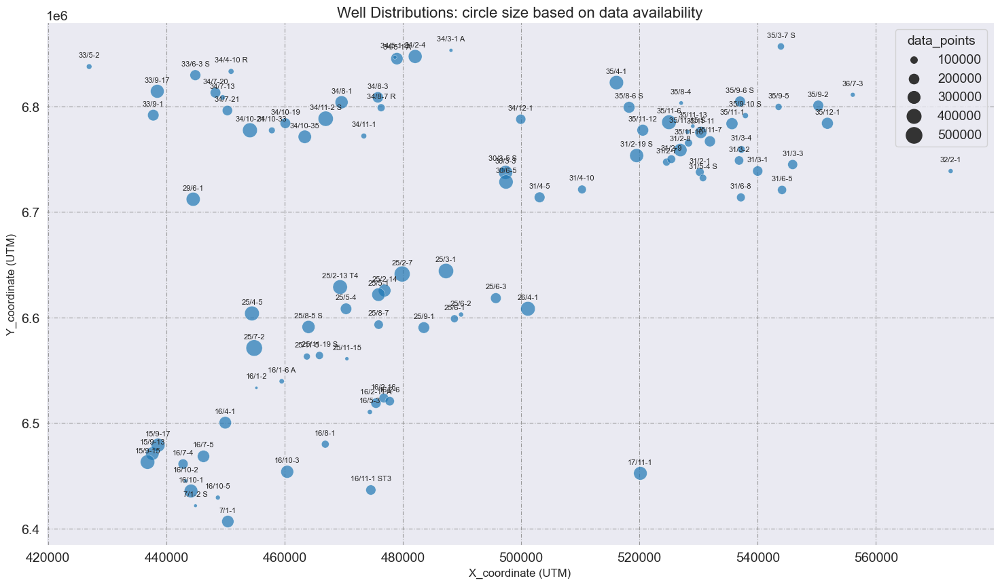

In [16]:
mapPlot()

#### 2.2 Визуализация каротажных кривых

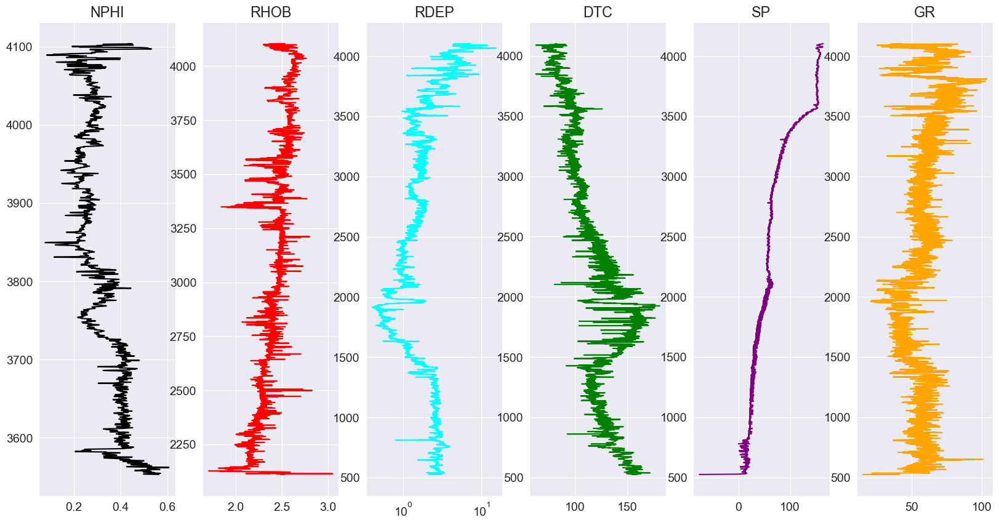

In [18]:
logs = ['NPHI', 'RHOB', 'RDEP', 'DTC', 'SP', 'GR']

fig, ax = plt.subplots(nrows=1, ncols=len(logs), figsize=(20,10))

colors = ['black', 'red', 'cyan', 'green', 'purple', 'orange', 'blue', 'yellow', 'magenta', 'brown', 'pink', 'lime']

for i in range(len(logs)):
    if i == 2:
        ax[i].semilogx(df.loc[df['WELL'] == '34/2-4'][logs[i]], df.loc[df['WELL'] == '34/2-4']['DEPTH_MD'], color=colors[i])
    else:
        ax[i].plot(df.loc[df['WELL'] == '34/2-4'][logs[i]], df.loc[df['WELL'] == '34/2-4']['DEPTH_MD'], color=colors[i])

    ax[i].set_title(logs[i])

plt.show()

### 2.3 Визуализации

Визуализируем количество записей о каждой горной породе

In [17]:
lithology_keys = {30000: 'Sandstone',
                 65030: 'Sandstone/Shale',
                 65000: 'Shale',
                 80000: 'Marl',
                 74000: 'Dolomite',
                 70000: 'Limestone',
                 70032: 'Chalk',
                 88000: 'Halite',
                 86000: 'Anhydrite',
                 99000: 'Tuff',
                 90000: 'Coal',
                 93000: 'Basement'}

df['FaciesLabels'] = df['FORCE_2020_LITHOFACIES_LITHOLOGY'].map(lithology_keys)

Распределение количества записей о каждой из пород

In [23]:
df['FaciesLabels'].value_counts()

Shale              720803
Sandstone          168937
Sandstone/Shale    150455
Limestone           56320
Marl                33329
Tuff                15245
Chalk               10513
Halite               8213
Coal                 3820
Dolomite             1688
Anhydrite            1085
Basement              103
Name: FaciesLabels, dtype: int64

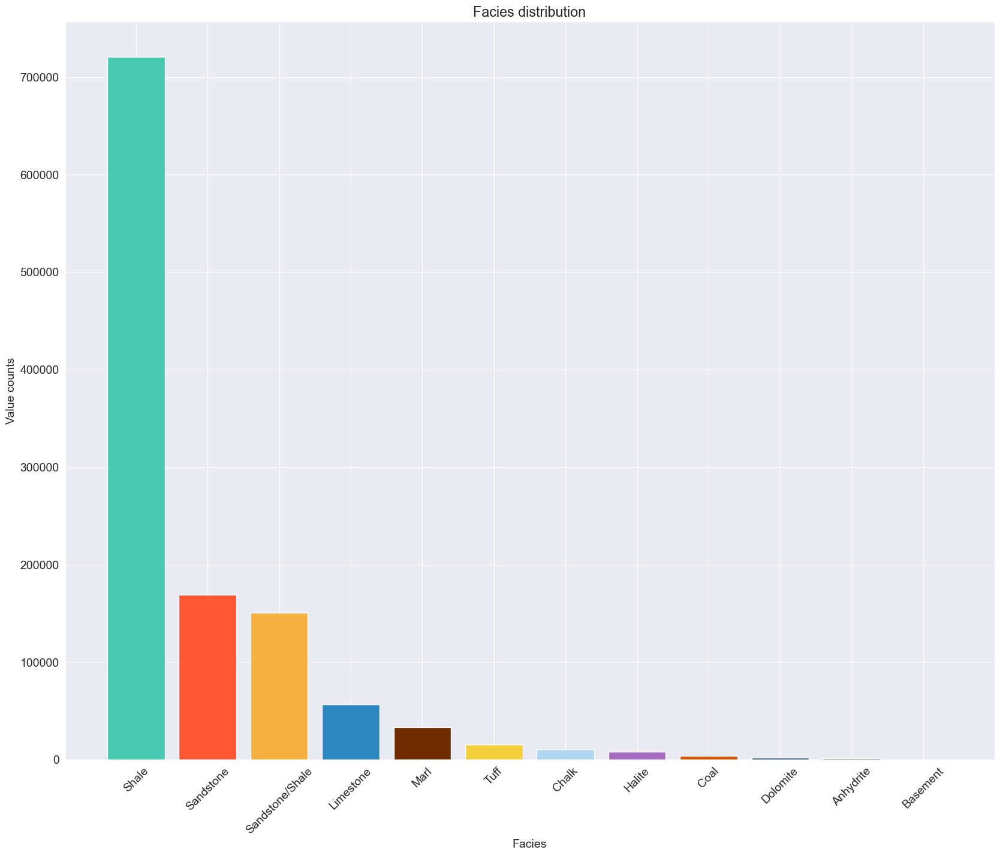

In [24]:
# Определение цветов для каждой фации
facies_colors = {'Sandstone': '#FF5733', 'Sandstone/Shale': '#F5B041', 'Shale': '#48C9B0',
                 'Marl': '#6E2C00', 'Dolomite': '#1B4F72', 'Limestone': '#2E86C1',
                 'Chalk': '#AED6F1', 'Halite': '#A569BD', 'Anhydrite': '#196F3D',
                 'Tuff': '#F4D03F', 'Coal': '#D35400', 'Basement': '#85929E'}

facies_counts = df['FaciesLabels'].value_counts()

plt.bar(facies_counts.index, facies_counts.values, color=[facies_colors[f] for f in facies_counts.index])
plt.title('Facies distribution')
plt.xlabel('Facies')
plt.ylabel('Value counts')

plt.xticks(rotation=45) 

plt.show()

Выбор признаков для решения задачи классификации

In [8]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns

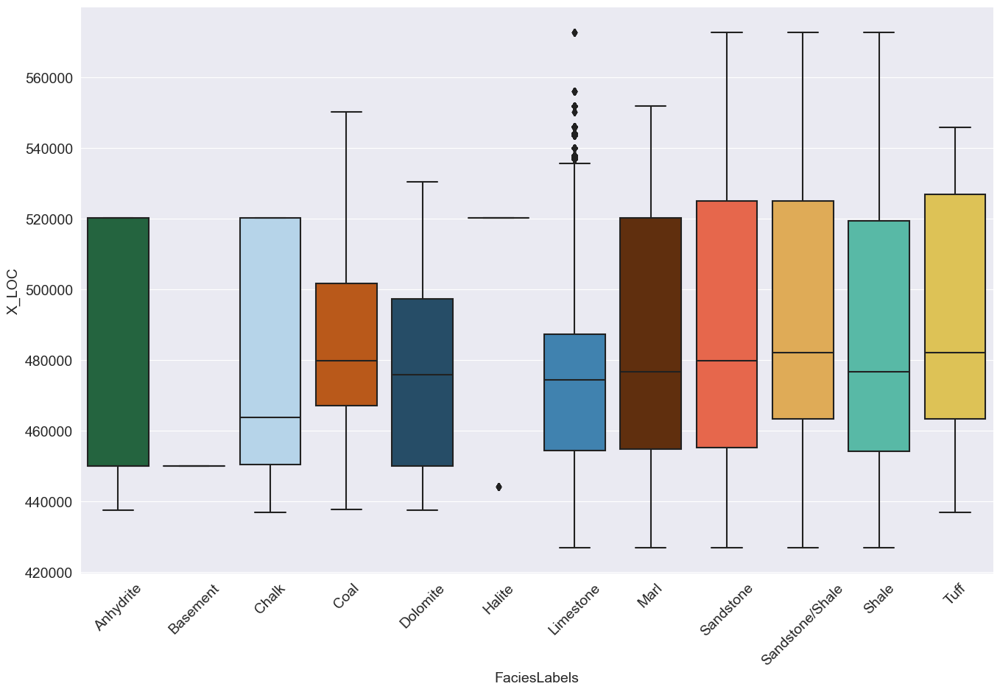

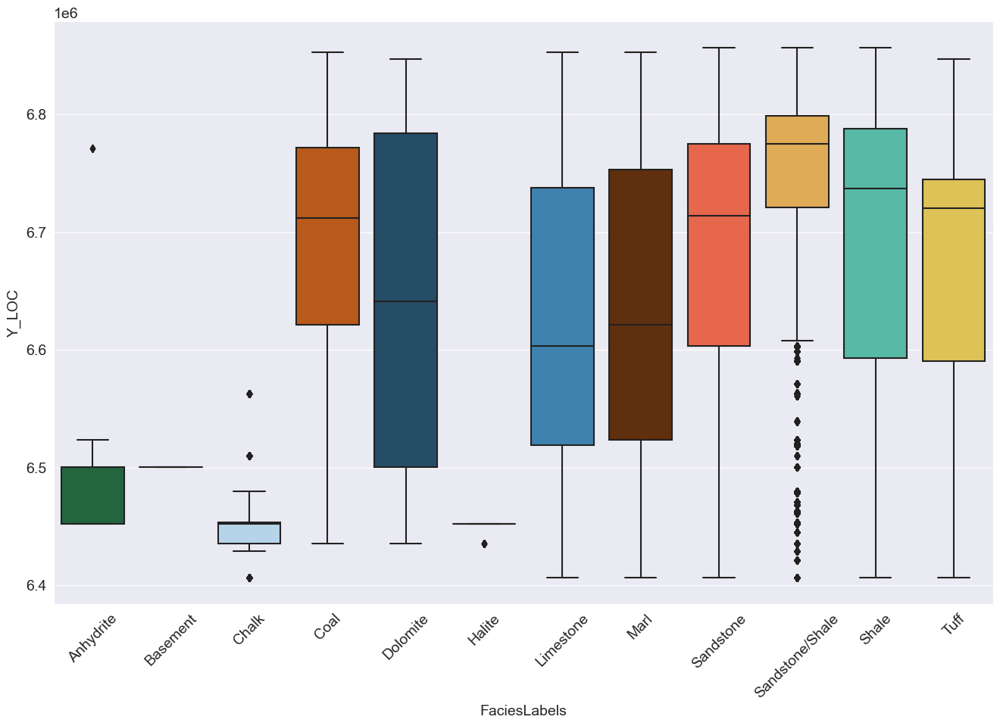

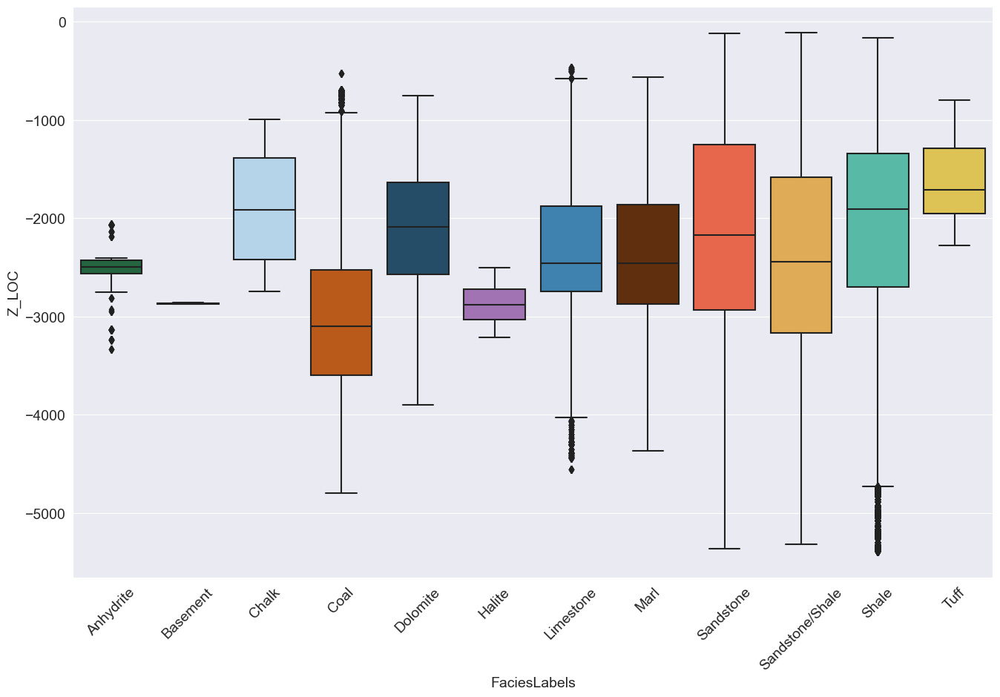

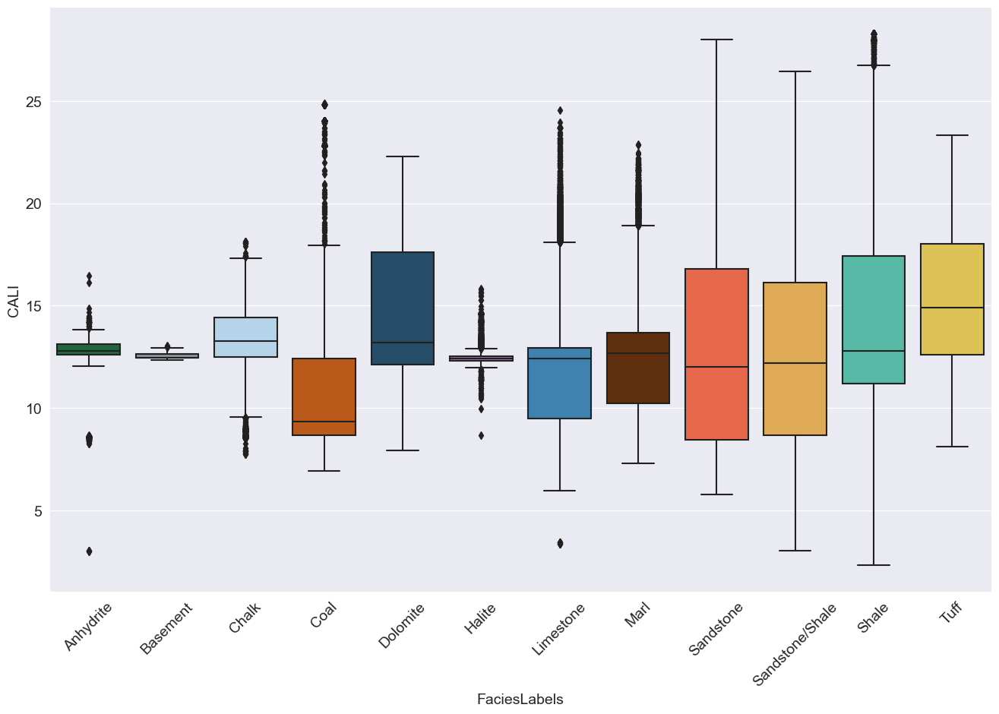

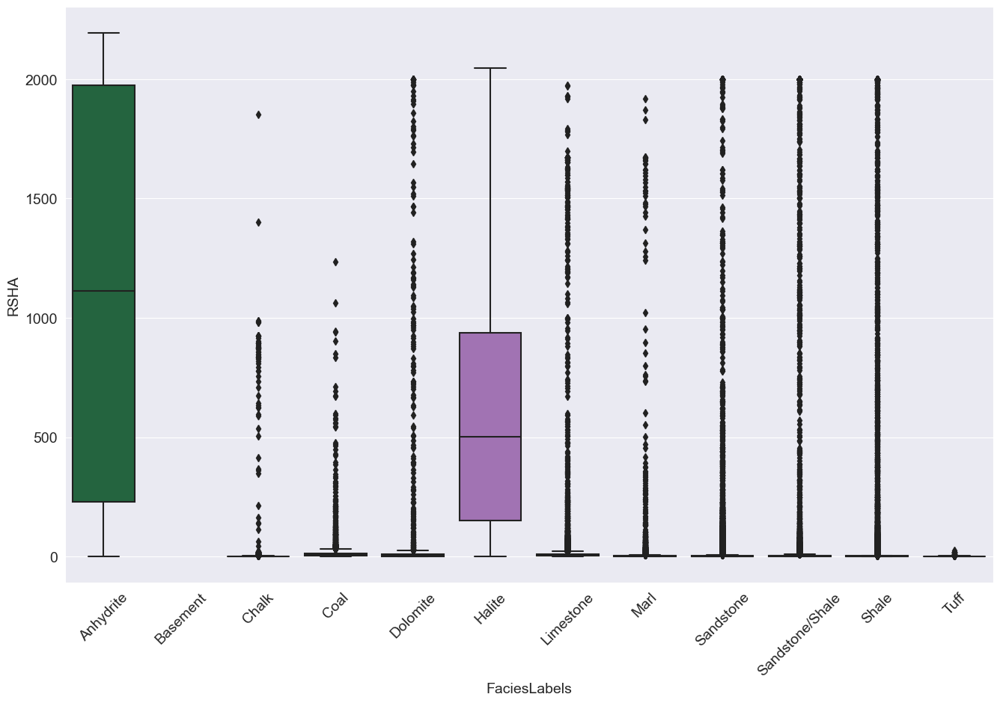

...

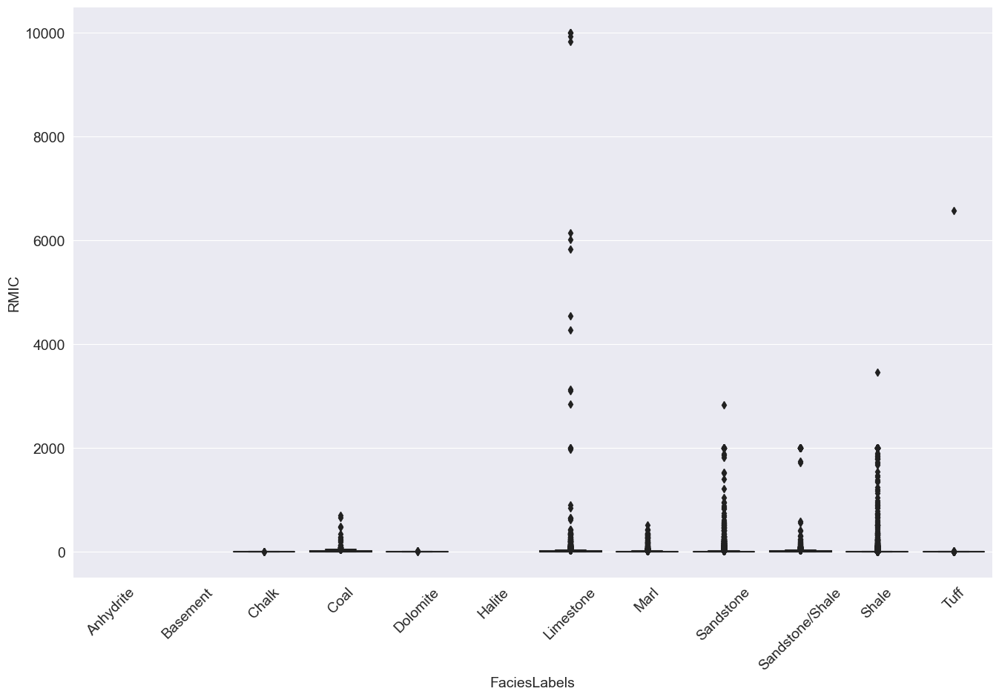

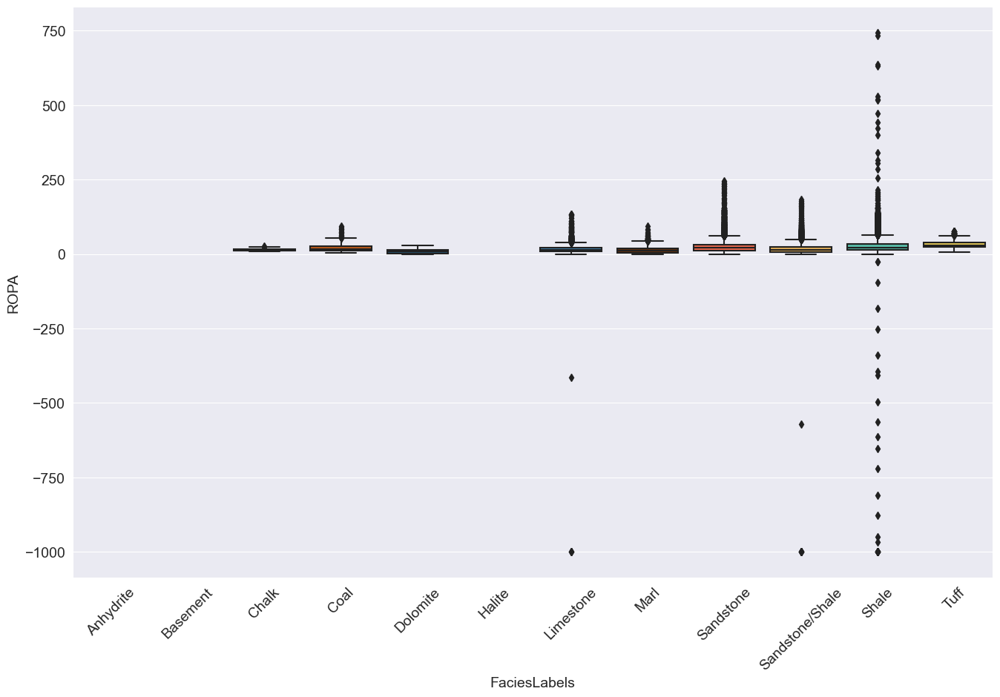

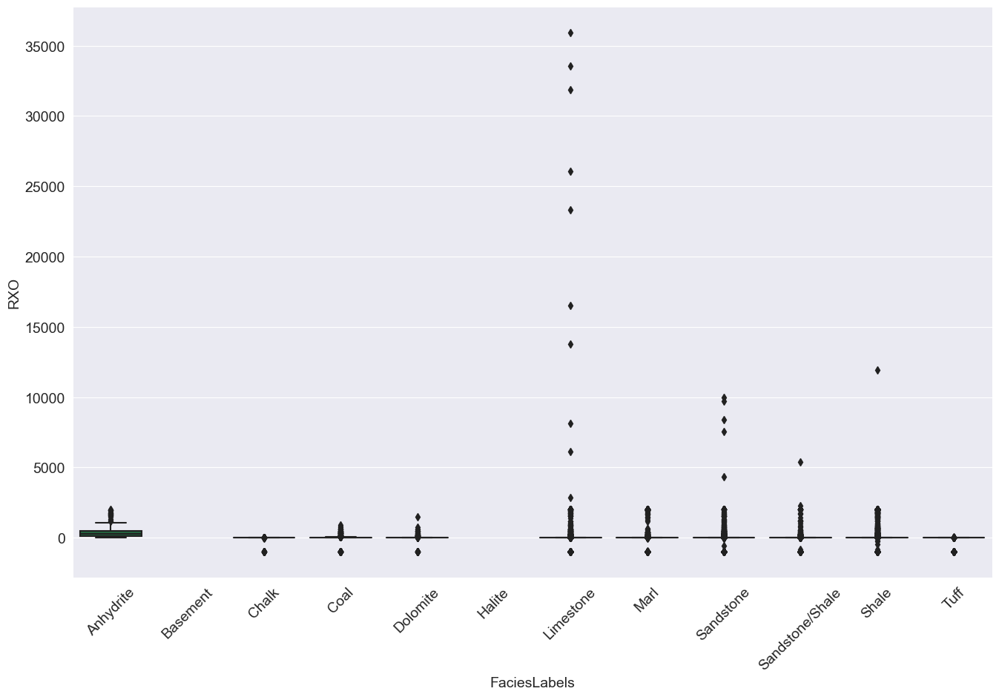

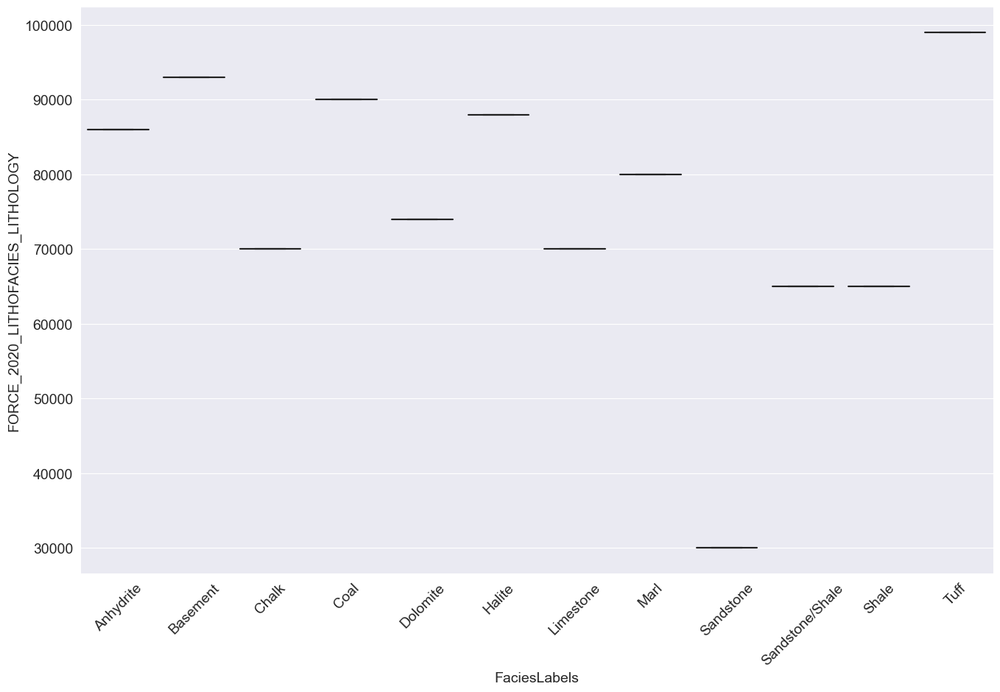

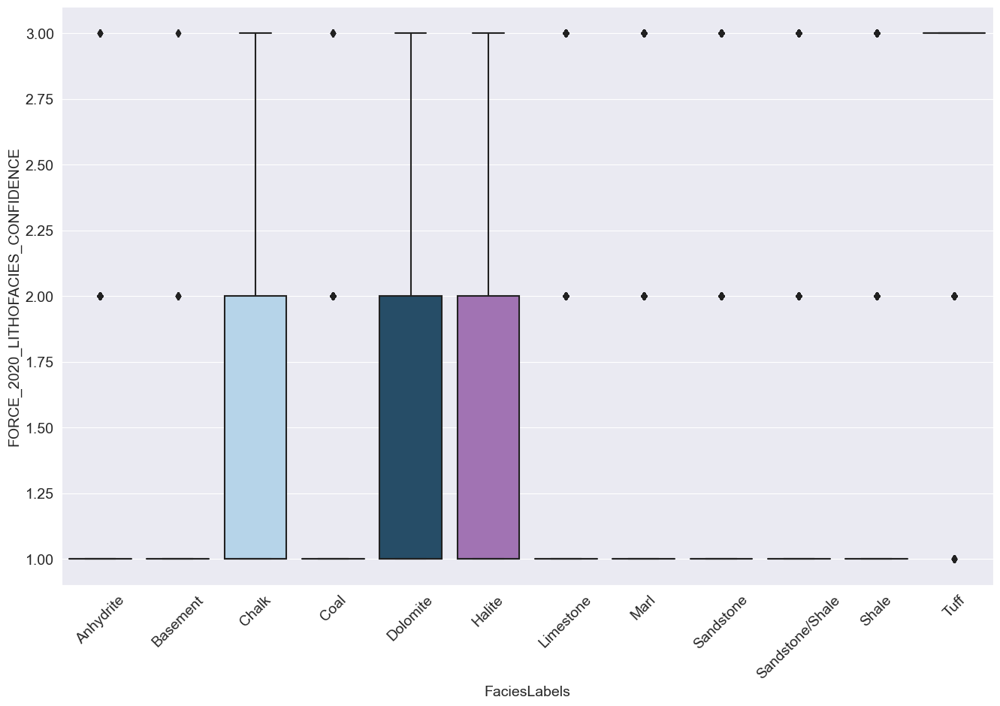

In [28]:
#Ящики с усами
for col in numeric_columns[1:]:
    if col != 'NM_M':
        fig = plt.figure()
        fig.set_size_inches(16, 10)
        sns.boxplot(y=col, x=df['FaciesLabels'].astype('category'), data=df, palette=facies_colors)
        plt.xticks(rotation=45)
        plt.show()

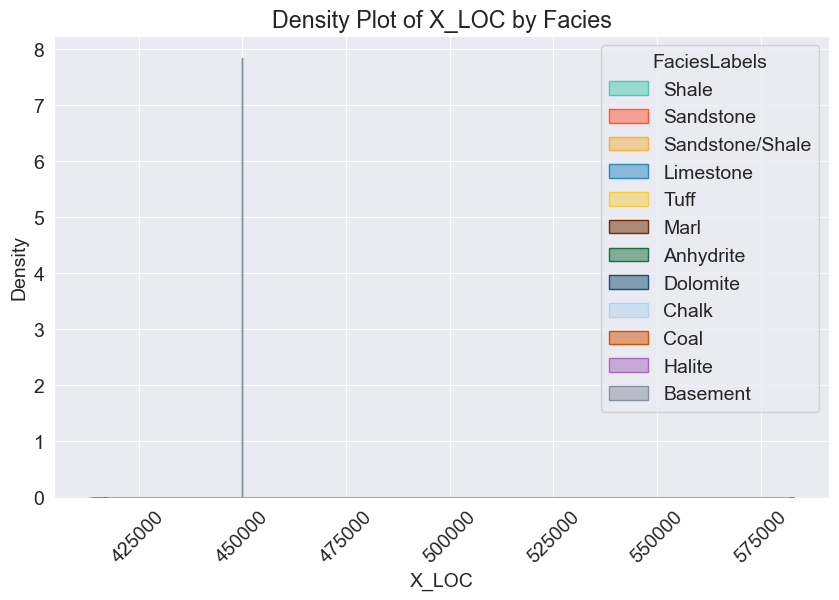

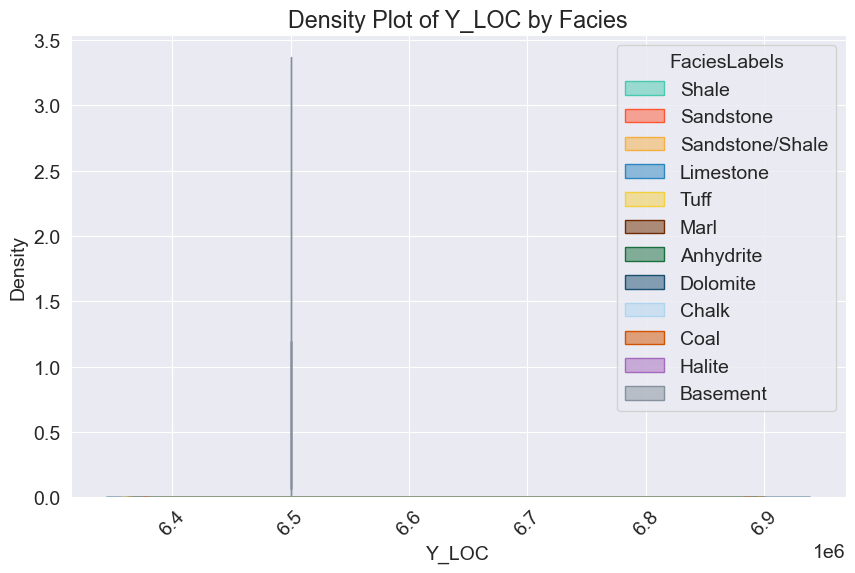

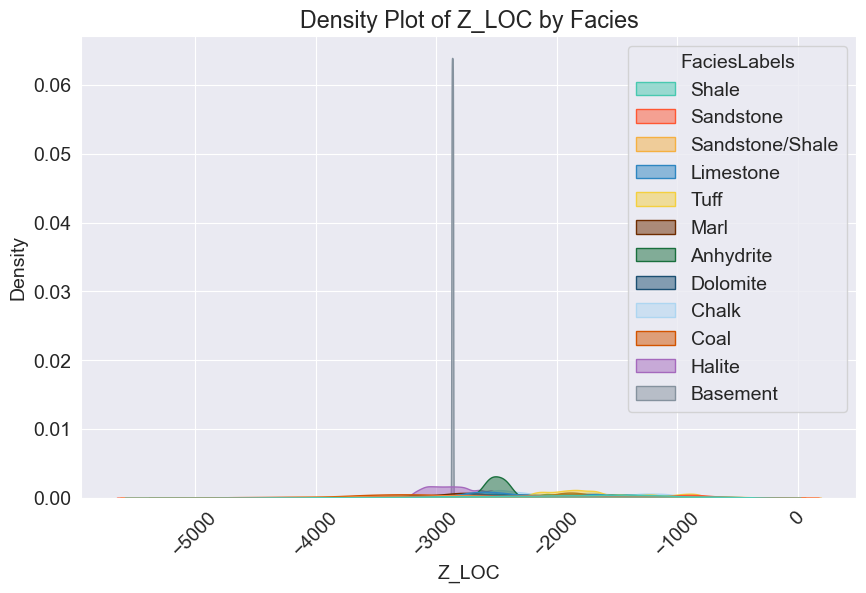

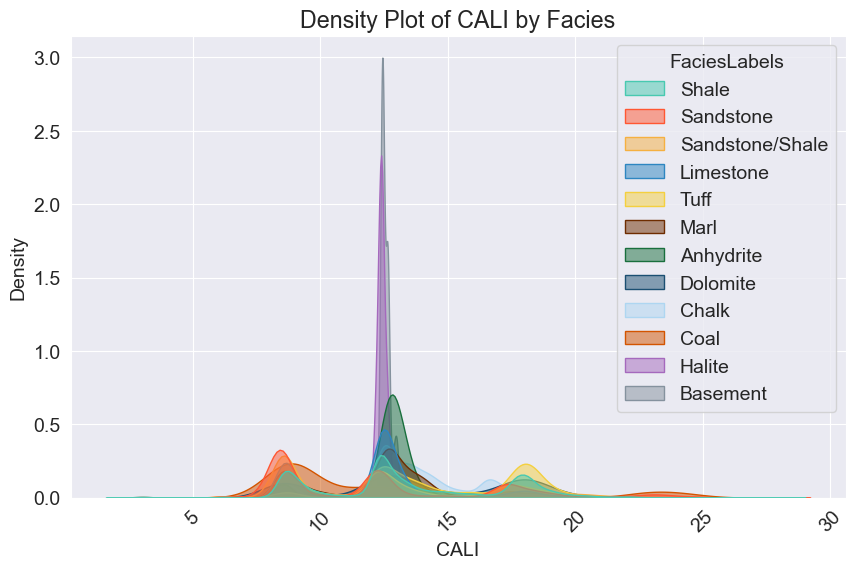

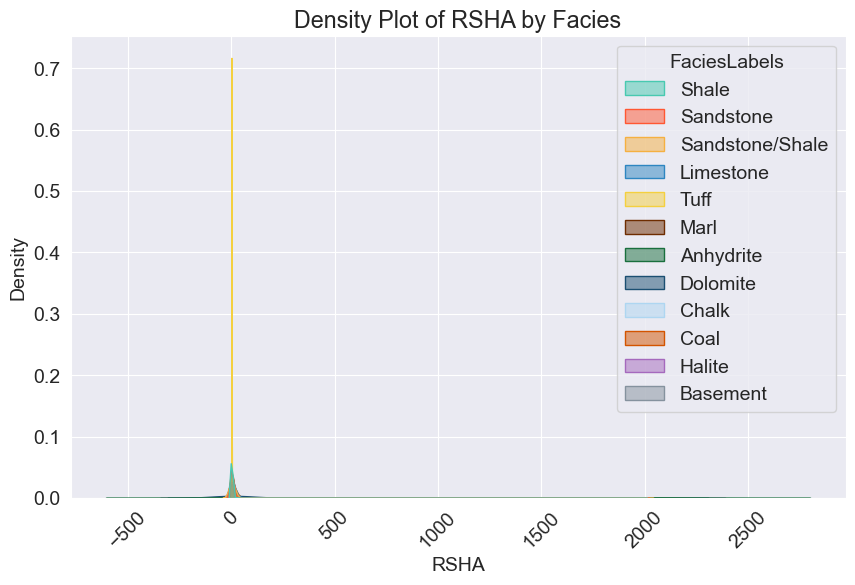

...

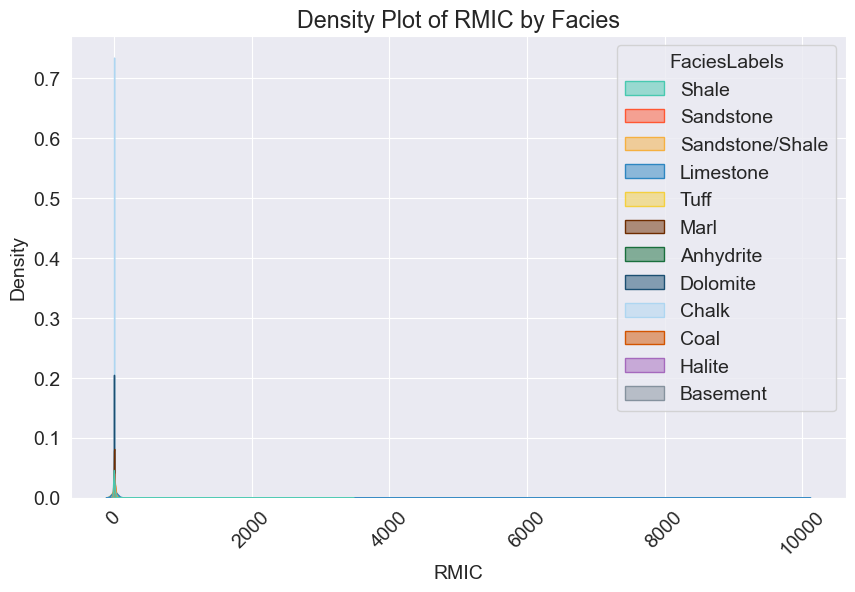

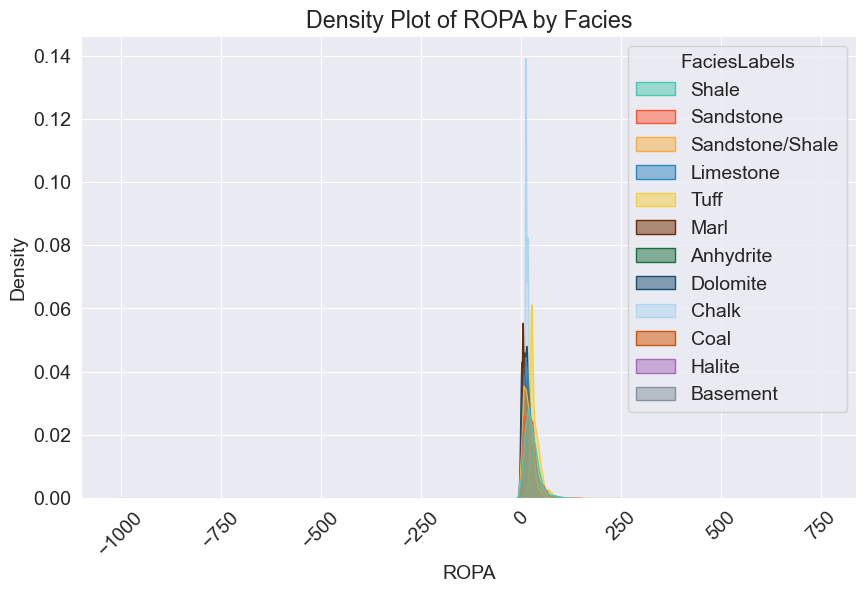

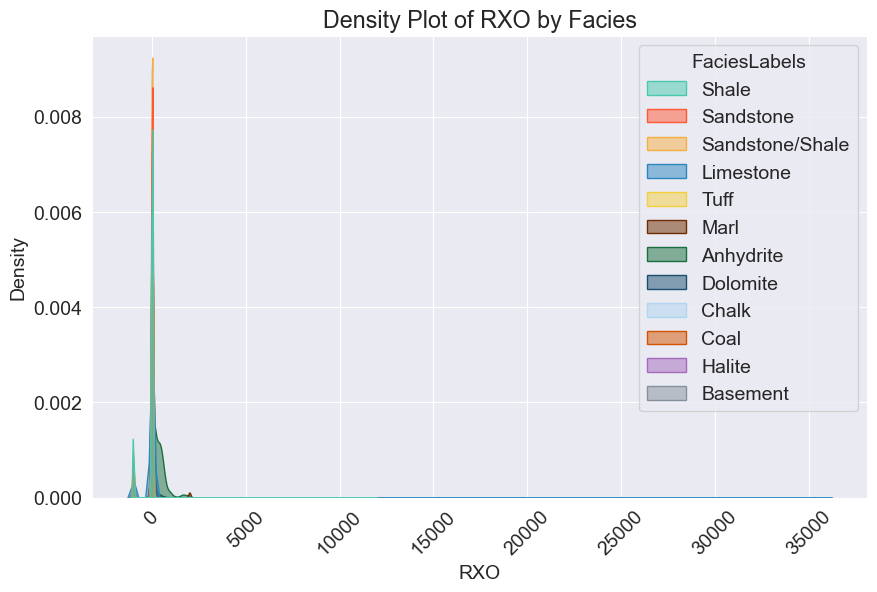

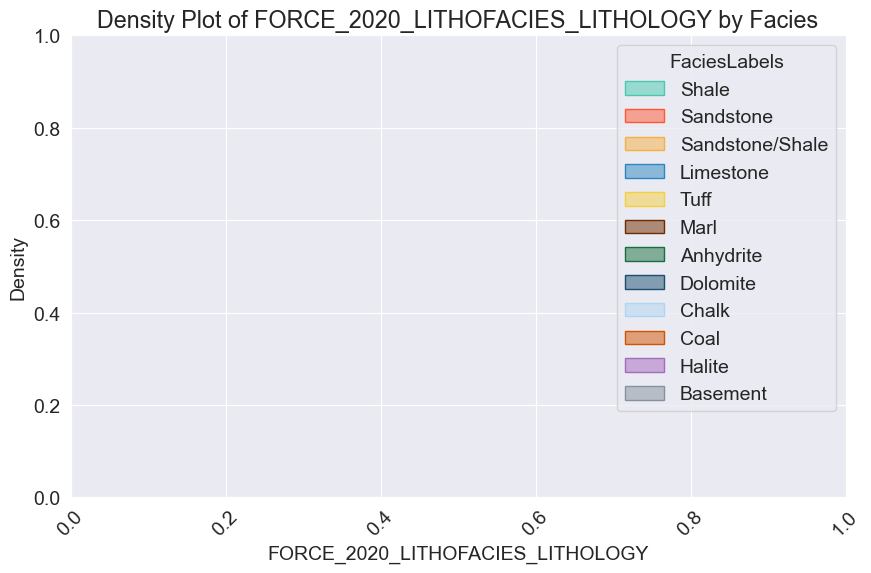

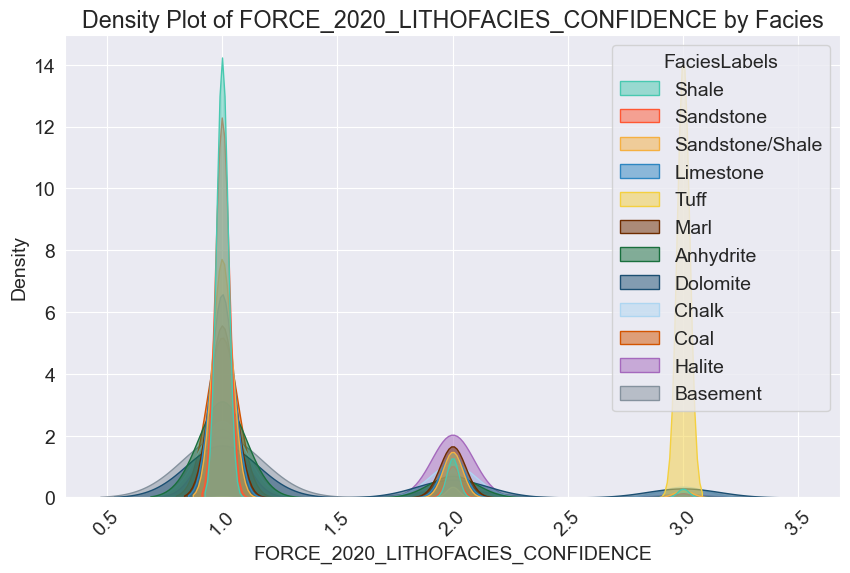

In [46]:
for col in numeric_columns[1:]:
    plt.figure(figsize=(10, 6))
    sns.kdeplot(data=df, x=col, hue='FaciesLabels', fill=True, common_norm=False, palette=facies_colors, alpha=0.5)
    plt.title(f'Density Plot of {col} by Facies')
    plt.xlabel(col)
    plt.ylabel('Density')
    #legend_labels = [facies_colors[color] for color in facies_colors.values()]
    # plt.legend(title='Facies', labels=legend_labels)
    #plt.legend(title='Facies')
    plt.xticks(rotation=45) 
    plt.show()

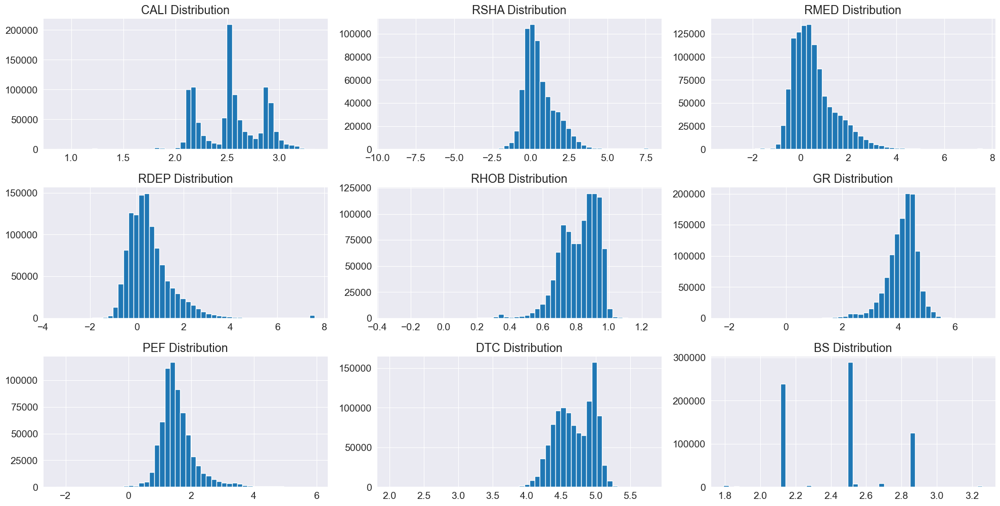

In [57]:
fig = plt.figure(figsize=(20, 20))
features = ['CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'PEF', 'DTC', 'BS']

for i, feature in enumerate(features):
    ax = fig.add_subplot(6, 3, i + 1)
    try:
        np.log(df[feature]).hist(bins=50, ax=ax)
    except:
        pass
    ax.set_title(feature + " Distribution")

fig.tight_layout()  
plt.show()

Подсчет количества уникальных и пропущенных значений

In [9]:
dftype = pd.DataFrame(df.dtypes, columns=['Data_Type'])
dftype['Number_Unique'] = df.nunique()
dftype['Nan_bool'] = df.isna().any()
dftype['Number_of_Nan'] = df.isna().sum()
dftype

,Data_Type,Number_Unique,Nan_bool,Number_of_Nan
WELL,object,98,False,0
DEPTH_MD,float64,1146418,False,0
X_LOC,float64,166525,True,10775
Y_LOC,float64,17481,True,10775
Z_LOC,float64,1128126,True,10775
GROUP,object,14,True,1278
FORMATION,object,69,True,136994
CALI,float64,874208,True,87877
RSHA,float64,619225,True,539861
RMED,float64,1104594,True,38993


Замена пропущенных значений в численных колонках средним значением

In [10]:
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

In [11]:
df[numeric_columns].isna().sum()

DEPTH_MD                             0
X_LOC                                0
Y_LOC                                0
Z_LOC                                0
CALI                                 0
RSHA                                 0
RMED                                 0
RDEP                                 0
RHOB                                 0
GR                                   0
SGR                                  0
NPHI                                 0
PEF                                  0
DTC                                  0
SP                                   0
BS                                   0
ROP                                  0
DTS                                  0
DCAL                                 0
DRHO                                 0
MUDWEIGHT                            0
RMIC                                 0
ROPA                                 0
RXO                                  0
FORCE_2020_LITHOFACIES_LITHOLOGY     0
FORCE_2020_LITHOFACIES_CO

### 2.4 Нормализация данных

Выбор признаков, которые будут использоваться для классификации

In [7]:
features = ['DEPTH_MD', 'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'PEF', 'DTC', 'BS', 'NPHI', 'SP']

In [56]:
df[features].head()

,RSHA,CALI,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,BS,ROP,DTS
0,10.694664,19.480835,1.611410,1.798681,1.884186,80.200851,0.331966,20.915468,161.131180,11.931432,34.636410,204.655019
1,10.694664,19.468800,1.618070,1.795641,1.889794,79.262886,0.331966,19.383013,160.603470,11.931432,34.636410,204.655019
2,10.694664,19.468800,1.626459,1.800733,1.896523,74.821999,0.331966,22.591518,160.173615,11.931432,34.779556,204.655019
3,10.694664,19.459282,1.621594,1.801517,1.891913,72.878922,0.331966,32.191910,160.149429,11.931432,39.965164,204.655019
4,10.694664,19.453100,1.602679,1.795299,1.880034,71.729141,0.331966,38.495632,160.128342,11.931432,57.483765,204.655019


In [12]:
scaler = MinMaxScaler().fit(df[features])

In [13]:
transformed_df = df

transformed_df[features] = scaler.transform(df[features])

In [14]:
transformed_df.describe()

,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RSHA,RMED,RDEP,RHOB,GR,...,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE
count,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,...,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06,1.170511e+06
mean,3.863755e-01,4.856310e+05,6.681276e+06,-2.138527e+03,4.180327e-01,4.874672e-03,2.511986e-03,5.330048e-03,5.714658e-01,6.575114e-02,...,1.373680e+02,2.046550e+02,1.223849e+00,1.219638e-02,1.216329e+00,7.796809e+00,2.350507e+01,-9.577950e+01,6.138598e+04,1.164258e+00
std,1.881282e-01,3.439699e+04,1.275612e+05,9.664633e+02,1.408723e-01,3.367212e-02,2.703090e-02,5.670939e-02,8.593419e-02,3.178840e-02,...,1.040794e+03,2.744899e+01,2.747313e+01,6.869624e+00,5.291056e+00,3.481446e+01,9.174184e+00,1.845736e+02,1.389170e+04,4.450840e-01
min,0.000000e+00,4.268988e+05,6.406641e+06,-5.395563e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-1.179770e-01,6.916318e+01,-1.221546e+01,-7.429339e+03,1.258177e-01,5.658556e-02,-9.992501e+02,-9.999000e+02,3.000000e+04,1.000000e+00
25%,2.419582e-01,4.548019e+05,6.593126e+06,-2.804552e+03,2.906809e-01,5.907715e-04,4.713978e-04,4.416133e-04,5.123182e-01,4.412660e-02,...,2.061029e+01,2.046550e+02,1.223849e+00,-6.882701e-03,1.216329e+00,7.796809e+00,2.350507e+01,-9.577950e+01,6.500000e+04,1.000000e+00
50%,3.660979e-01,4.777699e+05,6.732132e+06,-2.055283e+03,4.001156e-01,4.736759e-03,7.534114e-04,7.090959e-04,5.714658e-01,6.338678e-02,...,1.373680e+02,2.046550e+02,1.223849e+00,6.651836e-03,1.216329e+00,7.796809e+00,2.350507e+01,-9.577950e+01,6.500000e+04,1.000000e+00
75%,5.147218e-01,5.201314e+05,6.784877e+06,-1.397964e+03,5.168812e-01,4.874672e-03,1.525811e-03,1.292097e-03,6.365009e-01,8.257961e-02,...,1.373680e+02,2.046550e+02,1.223849e+00,1.555134e-02,1.216329e+00,7.796809e+00,2.350507e+01,1.201068e-01,6.500000e+04,1.000000e+00
max,1.000000e+00,5.726328e+05,6.856661e+06,-1.110860e+02,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,4.701512e+04,6.765781e+02,1.001142e+04,2.836938e+00,1.857309e+02,1.000000e+04,7.427979e+02,3.593067e+04,9.900000e+04,3.000000e+00


In [15]:
transformed_df

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RSHA,RMED,...,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE
0,15/9-13,0.067624,437641.96875,6.470972e+06,-469.501831,NORDLAND GP.,NaN,0.660761,0.004875,0.000815,...,34.636410,204.655019,1.223849,-0.574928,1.216329,7.796809,23.505069,-95.779496,65000,1.0
1,15/9-13,0.067652,437641.96875,6.470972e+06,-469.653809,NORDLAND GP.,NaN,0.660297,0.004875,0.000818,...,34.636410,204.655019,1.223849,-0.570188,1.216329,7.796809,23.505069,-95.779496,65000,1.0
2,15/9-13,0.067681,437641.96875,6.470972e+06,-469.805786,NORDLAND GP.,NaN,0.660297,0.004875,0.000822,...,34.779556,204.655019,1.223849,-0.574245,1.216329,7.796809,23.505069,-95.779496,65000,1.0
3,15/9-13,0.067710,437641.96875,6.470972e+06,-469.957794,NORDLAND GP.,NaN,0.659930,0.004875,0.000820,...,39.965164,204.655019,1.223849,-0.586315,1.216329,7.796809,23.505069,-95.779496,65000,1.0
4,15/9-13,0.067738,437641.96875,6.470972e+06,-470.109772,NORDLAND GP.,NaN,0.659692,0.004875,0.000810,...,57.483765,204.655019,1.223849,-0.597914,1.216329,7.796809,23.505069,-95.779496,65000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1170506,7/1-2 S,0.572248,485631.03274,6.681276e+06,-2138.527143,VESTLAND GP.,Bryne Fm.,0.234400,0.004875,0.002512,...,27.674368,204.655019,1.223849,-0.001763,1.216329,7.796809,26.673708,-95.779496,30000,2.0
1170507,7/1-2 S,0.572277,485631.03274,6.681276e+06,-2138.527143,VESTLAND GP.,Bryne Fm.,0.232707,0.004875,0.002512,...,28.024338,204.655019,1.223849,-0.007600,1.216329,7.796809,26.840818,-95.779496,65030,2.0
1170508,7/1-2 S,0.572305,485631.03274,6.681276e+06,-2138.527143,VESTLAND GP.,Bryne Fm.,0.231589,0.004875,0.002512,...,28.091282,204.655019,1.223849,-0.018297,1.216329,7.796809,27.007942,-95.779496,65030,2.0
1170509,7/1-2 S,0.572334,485631.03274,6.681276e+06,-2138.527143,VESTLAND GP.,Bryne Fm.,0.230182,0.004875,0.002512,...,28.019775,204.655019,1.223849,-0.011438,1.216329,7.796809,27.175179,-95.779496,65030,2.0


In [18]:
#Сохранение в файл 
selected_columns = features + ['FaciesLabels', 'FORCE_2020_LITHOFACIES_LITHOLOGY', 'WELL']

# Сохранение DataFrame в файл CSV
transformed_df[selected_columns].to_csv('../data/processed_data/transformed_data2.csv', 
                                        index=False)

## 3. Подготовка данных

In [19]:
transformed_df = pd.read_csv('../data/processed_data/transformed_data2.csv')

In [20]:
transformed_df

,DEPTH_MD,CALI,RSHA,RMED,RDEP,RHOB,GR,PEF,DTC,BS,NPHI,SP,FaciesLabels,FORCE_2020_LITHOFACIES_LITHOLOGY,WELL
0,0.067624,0.660761,0.004875,0.000815,0.000884,0.425020,0.074375,0.054345,0.491006,0.296572,0.355216,0.670980,Shale,65000,15/9-13
1,0.067652,0.660297,0.004875,0.000818,0.000882,0.427069,0.073504,0.050344,0.489320,0.296572,0.355216,0.670511,Shale,65000,15/9-13
2,0.067681,0.660297,0.004875,0.000822,0.000885,0.429527,0.069381,0.058721,0.487947,0.296572,0.355216,0.670524,Shale,65000,15/9-13
3,0.067710,0.659930,0.004875,0.000820,0.000885,0.427843,0.067576,0.083785,0.487870,0.296572,0.355216,0.670444,Shale,65000,15/9-13
4,0.067738,0.659692,0.004875,0.000810,0.000882,0.423503,0.066508,0.100243,0.487802,0.296572,0.355216,0.670647,Shale,65000,15/9-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1170506,0.572248,0.234400,0.004875,0.002512,0.005330,0.660253,0.072011,0.011714,0.338407,0.125000,0.355216,0.694199,Sandstone,30000,7/1-2 S
1170507,0.572277,0.232707,0.004875,0.002512,0.005330,0.663771,0.069884,0.018067,0.338407,0.125000,0.355216,0.694199,Sandstone/Shale,65030,7/1-2 S
1170508,0.572305,0.231589,0.004875,0.002512,0.005330,0.647054,0.061609,0.023366,0.338407,0.125000,0.355216,0.694199,Sandstone/Shale,65030,7/1-2 S
1170509,0.572334,0.230182,0.004875,0.002512,0.005330,0.630860,0.051702,0.022986,0.338407,0.125000,0.355216,0.694199,Sandstone/Shale,65030,7/1-2 S


In [21]:
transformed_df = transformed_df[transformed_df['FaciesLabels'] != 'Basement']

transformed_df['WELL'].value_counts().head()

25/2-7     25131
29/6-1     24464
25/7-2     23879
35/11-6    23544
34/2-4     23403
Name: WELL, dtype: int64

#### 3.1 Выбор тестовой части

In [22]:
transformed_df['WELL'].unique()

array(['15/9-13', '15/9-15', '15/9-17', '16/1-2', '16/1-6 A', '16/10-1',
       '16/10-2', '16/10-3', '16/10-5', '16/11-1 ST3', '16/2-11 A',
       '16/2-16', '16/2-6', '16/4-1', '16/5-3', '16/7-4', '16/7-5',
       '16/8-1', '17/11-1', '25/11-15', '25/11-19 S', '25/11-5',
       '25/2-13 T4', '25/2-14', '25/2-7', '25/3-1', '25/4-5', '25/5-1',
       '25/5-4', '25/6-1', '25/6-2', '25/6-3', '25/7-2', '25/8-5 S',
       '25/8-7', '25/9-1', '26/4-1', '29/6-1', '30/3-3', '30/3-5 S',
       '30/6-5', '31/2-1', '31/2-19 S', '31/2-7', '31/2-8', '31/2-9',
       '31/3-1', '31/3-2', '31/3-3', '31/3-4', '31/4-10', '31/4-5',
       '31/5-4 S', '31/6-5', '31/6-8', '32/2-1', '33/5-2', '33/6-3 S',
       '33/9-1', '33/9-17', '34/10-19', '34/10-21', '34/10-33',
       '34/10-35', '34/11-1', '34/11-2 S', '34/12-1', '34/2-4',
       '34/3-1 A', '34/4-10 R', '34/5-1 A', '34/5-1 S', '34/7-13',
       '34/7-20', '34/7-21', '34/8-1', '34/8-3', '34/8-7 R', '35/11-1',
       '35/11-10', '35/11-11', '35/11-12

Возьмем 12 последних скважин для валидации

In [23]:
all_wells = transformed_df['WELL'].unique().tolist()
test_wells = all_wells[:12]
    
# Определяем тренировочные скважины, исключая скважины из валидационного набора
training_wells = [well for well in all_wells if well not in test_wells]

In [24]:
print("Скважины из валидационного набора:", test_wells)

print("Скважины из тренировочного набора:", training_wells)

Скважины из валидационного набора: ['15/9-13', '15/9-15', '15/9-17', '16/1-2', '16/1-6 A', '16/10-1', '16/10-2', '16/10-3', '16/10-5', '16/11-1 ST3', '16/2-11 A', '16/2-16']
Скважины из тренировочного набора: ['16/2-6', '16/4-1', '16/5-3', '16/7-4', '16/7-5', '16/8-1', '17/11-1', '25/11-15', '25/11-19 S', '25/11-5', '25/2-13 T4', '25/2-14', '25/2-7', '25/3-1', '25/4-5', '25/5-1', '25/5-4', '25/6-1', '25/6-2', '25/6-3', '25/7-2', '25/8-5 S', '25/8-7', '25/9-1', '26/4-1', '29/6-1', '30/3-3', '30/3-5 S', '30/6-5', '31/2-1', '31/2-19 S', '31/2-7', '31/2-8', '31/2-9', '31/3-1', '31/3-2', '31/3-3', '31/3-4', '31/4-10', '31/4-5', '31/5-4 S', '31/6-5', '31/6-8', '32/2-1', '33/5-2', '33/6-3 S', '33/9-1', '33/9-17', '34/10-19', '34/10-21', '34/10-33', '34/10-35', '34/11-1', '34/11-2 S', '34/12-1', '34/2-4', '34/3-1 A', '34/4-10 R', '34/5-1 A', '34/5-1 S', '34/7-13', '34/7-20', '34/7-21', '34/8-1', '34/8-3', '34/8-7 R', '35/11-1', '35/11-10', '35/11-11', '35/11-12', '35/11-13', '35/11-15 S', '35/

In [25]:
# Выбираем строки для валидационного набора
test_data = transformed_df[transformed_df['WELL'].isin(test_wells)]

In [26]:
test_data['WELL'].value_counts()

15/9-13        18270
15/9-15        17717
16/10-1        17675
15/9-17        17350
16/10-3        15956
16/11-1 ST3    14938
16/2-11 A      10708
16/2-16        10025
16/1-6 A        3623
16/10-5         2765
16/10-2         2437
16/1-2          1734
Name: WELL, dtype: int64

#### 3.2 Выбор тренировочной части

In [27]:
# Выбираем строки для тренировочного набора
training_data = transformed_df[~transformed_df['WELL'].isin(test_wells)]

In [28]:
training_data.head()

,DEPTH_MD,CALI,RSHA,RMED,RDEP,RHOB,GR,PEF,DTC,BS,NPHI,SP,FaciesLabels,FORCE_2020_LITHOFACIES_LITHOLOGY,WELL
133198,0.113026,0.422663,0.004875,0.000594,0.000569,0.571466,0.088183,0.016239,0.338407,0.19375,0.137846,0.694199,Shale,65000,16/2-6
133199,0.113055,0.425611,0.004875,0.000594,0.000568,0.571466,0.087025,0.016239,0.338407,0.19375,0.139436,0.694199,Shale,65000,16/2-6
133200,0.113084,0.428148,0.004875,0.000591,0.000565,0.571466,0.085964,0.016239,0.338407,0.19375,0.145418,0.694199,Shale,65000,16/2-6
133201,0.113112,0.422794,0.004875,0.000587,0.000559,0.571466,0.086789,0.016239,0.338407,0.19375,0.150748,0.694199,Shale,65000,16/2-6
133202,0.113141,0.420698,0.004875,0.000586,0.000557,0.571466,0.088310,0.016239,0.338407,0.19375,0.155072,0.694199,Shale,65000,16/2-6


In [29]:
training_data.shape, test_data.shape

((1037210, 15), (133198, 15))

### 3.3 Разбиение на признаки и целевую переменную обеих частей

#### 3.3.1 Тенировочная часть

In [30]:
y_train = training_data['FaciesLabels']
X_train = training_data[features]

In [31]:
y_train.shape[0], X_train.shape 

(1037210, (1037210, 12))

#### 3.3.2 Тестовая часть

In [32]:
y_test = test_data['FaciesLabels']
X_test = test_data[features]

In [33]:
y_test.shape[0], X_test.shape

(133198, (133198, 12))

### 3.4 Определение функций для визуализации 

In [34]:
#Формирование датеферйма для визуализации классификации из тестовых данных
results_df = transformed_df[transformed_df['WELL'].isin(test_wells)]

lithology_numbers = {30000: 0,
                 65030: 1,
                 65000: 2,
                 80000: 3,
                 74000: 4,
                 70000: 5,
                 70032: 6,
                 88000: 7,
                 86000: 8,
                 99000: 9,
                 90000: 10,
                 93000: 11}

lithology_keys = {'Sandstone' : 30000,
                 'Sandstone/Shale' : 65030,
                 'Shale' : 65000,
                 'Marl' : 80000,
                 'Dolomite' : 74000,
                 'Limestone' : 70000,
                 'Chalk' : 70032,
                 'Halite' : 88000,
                 'Anhydrite' : 86000,
                 'Tuff' : 99000,
                 'Coal' : 90000,
                 'Basement' : 93000}

results_df['Facies'] = results_df['FORCE_2020_LITHOFACIES_LITHOLOGY'].map(lithology_numbers)
results_df['Depth'] = results_df['DEPTH_MD']

selected_logs = ['CALI', 'GR', 'RHOB', 'NPHI', 'RDEP', 'PEF']

facies_names = lithology_keys.values()

facies_colors = ['darkorange', '#228B22', 'grey', 'cyan', 'gold', 'lightseagreen', 
                 'lawngreen', 'lightblue', 'tan', '#FF4500', '#000000', 'magenta']

In [35]:
def log_plot(dataframe, logs, well_name, predicted_col):
        
    # Убедимся, что логи отсортированы по глубине
    facies_colors = ['darkorange', '#228B22', 'grey', 'cyan', 'gold', 'lightseagreen', 
                 'lawngreen', 'lightblue', 'tan', '#FF4500', '#000000', 'magenta']
    
    cmap_facies = ListedColormap(facies_colors, 'indexed')

    colours=['k','b','r','g','m','c','lime','gold','sienna']

    ztop=dataframe['Depth'].min(); zbot=dataframe['Depth'].max()
    
    cluster1 = np.repeat(np.expand_dims(dataframe[predicted_col].values, 1), 100, 1)
    num_curves = len(logs)
    
    # Определяем фигуру и оси
    f, ax = plt.subplots(nrows=1, ncols=num_curves+1, figsize=(16, 16))
    
    # Рисуем логи
    for ic, col in enumerate(logs):
        if np.all(np.isnan(dataframe[col])):
            log = np.empty(dataframe[col].values.shape)
            log[:] = np.nan
            
        else:
            log = dataframe[col]
            
        ax[ic].plot(log, dataframe['Depth'], colours[ic])
        ax[ic].set_xlabel(col)
        if ic != 0:
            ax[ic].set_yticklabels([])

    # Рисуем cluster1
    im1 = ax[num_curves].imshow(cluster1, interpolation='none', aspect='auto',
                    cmap=cmap_facies, vmin=0, vmax=len(facies_colors) - 1)
    
    divider = make_axes_locatable(ax[num_curves])
    cax = divider.append_axes("right", size="20%", pad=0.05)
    cbar = plt.colorbar(im1, cax=cax)
    cbar.set_label((12*' ').join(['SS', 'SS-Sh', 'Sh', 
                                ' Marl', 'Dol', 'Lims', 'Chlk ', 
                                '  Hal', 'Anhy', 'Tuf', 'Coal', 'Bsmt']))
    cbar.set_ticks(range(0,1))
    cbar.set_ticklabels('')
    
    # Настройка других параметров графика
    for i in range(len(ax)-1):
        ax[i].set_ylim(ztop, zbot)
        ax[i].invert_yaxis()
        ax[i].grid(False)
        ax[i].locator_params(axis='x', nbins=2)
        ax[i].set_xticks([])

    ax[0].set_ylabel("DEPTH")
    ax[num_curves].set_xlabel('Predicted Facies')
    ax[num_curves].set_yticklabels([])
    ax[num_curves].set_xticklabels([])
    
    f.subplots_adjust(wspace=0.1) 
    f.suptitle('Well: %s'% well_name, fontsize=20, y=0.9)


In [36]:
def compare_facies(dataframe, well_name, predicted_col):
    
    facies_colors = ['darkorange', '#228B22', 'grey', 'cyan', 'gold', 'lightseagreen', 
                 'lawngreen', 'lightblue', 'tan', '#FF4500', '#000000', 'magenta']
    
    cmap_facies = ListedColormap(facies_colors, 'indexed')
    ztop=dataframe['Depth'].min(); zbot=dataframe['Depth'].max()
    
    cluster1 = np.repeat(np.expand_dims(dataframe['Facies'].values, 1), 100, 1)
    cluster2 = np.repeat(np.expand_dims(dataframe[predicted_col].values, 1), 100, 1)
    f, ax = plt.subplots(nrows=1, ncols=2, figsize=(4, 10))
    
    im1 = ax[0].imshow(cluster1, interpolation='none', aspect='auto',
                    cmap=cmap_facies, vmin=0, vmax=len(facies_colors) - 1)
    
    im2 = ax[1].imshow(cluster2, interpolation='none', aspect='auto',
                    cmap=cmap_facies, vmin=0, vmax=len(facies_colors) - 1)

    divider = make_axes_locatable(ax[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im2, cax=cax)
    cbar.set_label((5*' ').join(['SS', 'SS-Sh', 'Sh', 
                                ' Marl', 'Dol', 'Lims', ' Chlk ', 
                                '  Hal', 'Anhy', ' Tuf', '  Coal ', 'Bsmt']))
    cbar.set_ticks(range(0,1)); 
    cbar.set_ticklabels('')
    ax[0].set_ylabel("DEPTH")
    ax[0].set_xlabel('Facies')
    ax[0].set_yticklabels([])
    ax[0].set_xticklabels([])
    ax[1].set_xlabel('Predicted Facies')
    ax[1].set_yticklabels([])
    ax[1].set_xticklabels([])
    ax[0].grid(False)
    ax[1].grid(False)
    
    f.subplots_adjust(wspace=0.1)
    f.suptitle('Well: %s'% well_name, fontsize=12, x = 0.5, y = 0.9)

In [37]:
def compare_all_facies(dataframe, well_name, column_names):
    
    num_columns = len(column_names)
    num_plots = num_columns + 1  # Отрисовки фасций + истинные фасции
    
    facies_colors = ['darkorange', '#228B22', 'grey', 'cyan', 'gold', 'lightseagreen', 
                 'lawngreen', 'lightblue', 'tan', '#FF4500', '#000000', 'magenta']
    cmap_facies = ListedColormap(facies_colors, 'indexed')
    
    ztop = dataframe['Depth'].min()
    zbot = dataframe['Depth'].max()
    cluster1 = np.repeat(np.expand_dims(dataframe['Facies'].values, 1), 100, 1)
    
    f, ax = plt.subplots(nrows=1, ncols=num_plots, figsize=(num_plots * 4, 10))
    
    im1 = ax[0].imshow(cluster1, interpolation='none', aspect='auto',
                       cmap=cmap_facies, vmin=0, vmax=len(facies_colors) - 1)
    
    ax[0].set_ylabel("DEPTH")
    ax[0].set_xlabel('Facies')
    ax[0].set_yticklabels([])
    ax[0].set_xticklabels([])
    ax[0].grid(False)  # Убираем сетку для первого столбца
    
    for i in range(num_columns):
        cluster = np.repeat(np.expand_dims(dataframe[column_names[i]].values, 1), 100, 1)
        im = ax[i + 1].imshow(cluster, interpolation='none', aspect='auto',
                              cmap=cmap_facies, vmin=0, vmax=len(facies_colors) - 1)
        ax[i + 1].set_xlabel(column_names[i])
        ax[i + 1].set_yticklabels([])
        ax[i + 1].set_xticklabels([])
        ax[i + 1].grid(False)
    
    divider = make_axes_locatable(ax[-1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im1, cax=cax)
    cbar.set_label((5 * ' ').join(['SS', 'SS-Sh', 'Sh', 
                                   'Marl', 'Dol', 'Lims', 'Chlk', 
                                   'Hal', 'Anhy', 'Tuf', 'Coal', 'Bsmt']))
    cbar.set_ticks(range(0, 1))
    cbar.set_ticklabels('')
    
    f.subplots_adjust(wspace=0.1)
    f.suptitle('Well: %s' % well_name, fontsize=12, x=0.5, y=0.9)


## 4. Обучение моделей

### 4.1 Логистическая регрессия

In [479]:
%%time
model_logreg = LogisticRegression()

logreg_params = {
    'penalty': ['l1', 'l2'],  # тип регуляризации
    'C': [0.001, 0.01, 0.1, 1, 10],  # параметр регуляризации
    'solver': ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']  # алгоритм оптимизации
}

rs_logreg = RandomizedSearchCV(estimator=model_logreg, param_distributions=logreg_params, cv=3, scoring='accuracy', n_iter=10, random_state=42)

rs_logreg.fit(X_train, y_train)

Wall time: 1h 50min 45s


RandomizedSearchCV(cv=3, estimator=LogisticRegression(),
                   param_distributions={'C': [0.001, 0.01, 0.1, 1, 10],
                                        'penalty': ['l1', 'l2'],
                                        'solver': ['liblinear', 'newton-cg',
                                                   'lbfgs', 'sag', 'saga']},
                   random_state=42, scoring='accuracy')

In [480]:
rs_logreg.best_params_

{'solver': 'liblinear', 'penalty': 'l1', 'C': 1}

Обучение модели логистической регресии

In [38]:
model_logreg = LogisticRegression(solver = 'liblinear')

In [39]:
%%time
model_logreg.fit(X_train, y_train)

Wall time: 1min 24s


LogisticRegression(solver='liblinear')

Получение предсказаний

In [40]:
LR_train_preds = model_logreg.predict(X_train)
print(LR_train_preds)

['Shale' 'Shale' 'Shale' ... 'Shale' 'Shale' 'Shale']


Вероятности, с которой модель отнесла первый элемент из тренировочного набора к каждому из классов

In [41]:
LR_probs = model_logreg.predict_proba(X_train)[39393]
LR_classes = model_logreg.classes_

for class_, prob in zip(LR_classes, LR_probs):
    print(f"Class '{class_}': Probability {prob:.4f}")

Class 'Anhydrite': Probability 0.0000
Class 'Chalk': Probability 0.0033
Class 'Coal': Probability 0.0000
Class 'Dolomite': Probability 0.0033
Class 'Halite': Probability 0.0000
Class 'Limestone': Probability 0.0238
Class 'Marl': Probability 0.0364
Class 'Sandstone': Probability 0.0677
Class 'Sandstone/Shale': Probability 0.1313
Class 'Shale': Probability 0.7083
Class 'Tuff': Probability 0.0258


Точность на тренировочной и тестовой выборках

In [42]:
LR_train_accuracy = accuracy_score(y_train, LR_train_preds)
print(f"Accuracy на тренировочной выборке: {LR_train_accuracy:.3f}")

Accuracy на тренировочной выборке: 0.702


In [43]:
LR_test_preds = model_logreg.predict(X_test)

In [44]:
LR_test_accuracy = accuracy_score(y_test, LR_test_preds)
print(f"Accuracy на тестовой выборке: {LR_test_accuracy:.3f}")

Accuracy на тестовой выборке: 0.693


Отчет о классификации на тестовой выборке

In [45]:
print(classification_report(y_test, LR_test_preds, digits = 3, zero_division=1))

                 precision    recall  f1-score   support

      Anhydrite      1.000     0.372     0.542       374
          Chalk      1.000     0.000     0.000      5129
           Coal      0.605     0.448     0.515        58
       Dolomite      1.000     0.000     0.000       188
         Halite      1.000     0.000     0.000      4314
      Limestone      0.529     0.096     0.162     11912
           Marl      1.000     0.000     0.000      4968
      Sandstone      0.291     0.596     0.391     15794
Sandstone/Shale      0.150     0.007     0.013      6573
          Shale      0.831     0.990     0.904     82390
           Tuff      1.000     0.000     0.000      1498

       accuracy                          0.693    133198
      macro avg      0.764     0.228     0.230    133198
   weighted avg      0.727     0.693     0.622    133198



Вывод матрицы ошибок

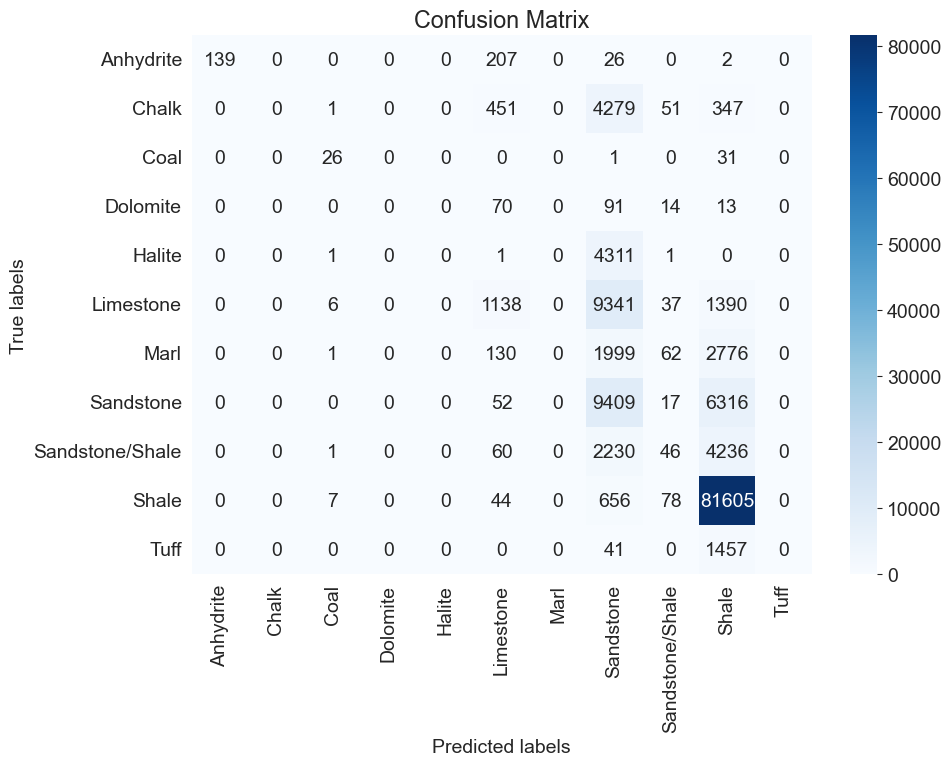

In [46]:
# Создание матрицы ошибок
conf_matrix = confusion_matrix(y_test, LR_test_preds)

conf_df = pd.DataFrame(conf_matrix, index = model_logreg.classes_, columns = model_logreg.classes_)

# Визуализация матрицы ошибок с помощью heatmap
plt.figure(figsize=(10,7))
sns.heatmap(conf_df, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

Визуализация результатов классификации

In [47]:
results_df.loc[:, 'LR_predictions'] = model_logreg.predict(X_test)
results_df.loc[:, 'LR_predictions'] = results_df['LR_predictions'].map(lithology_keys).map(lithology_numbers)

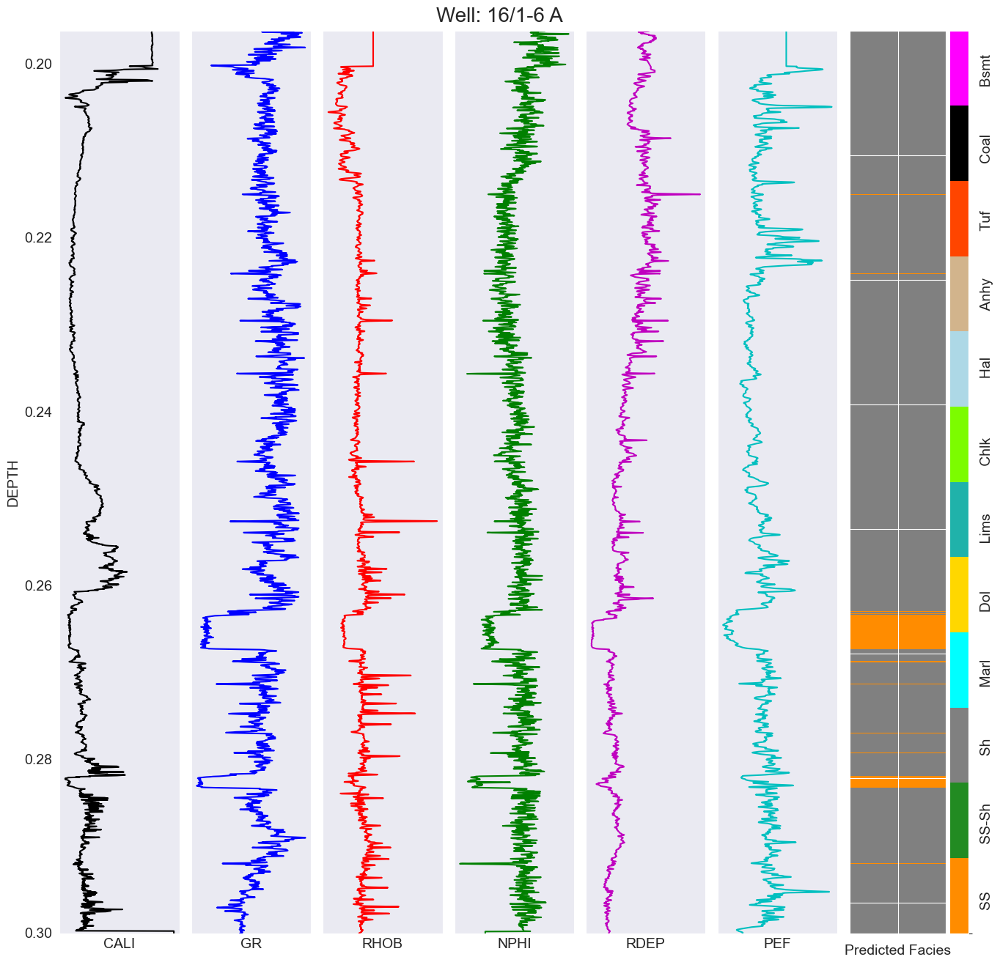

In [48]:
well_no = 4
log_plot(results_df[results_df['WELL'] == test_wells[well_no]], selected_logs, test_wells[well_no], 'LR_predictions')

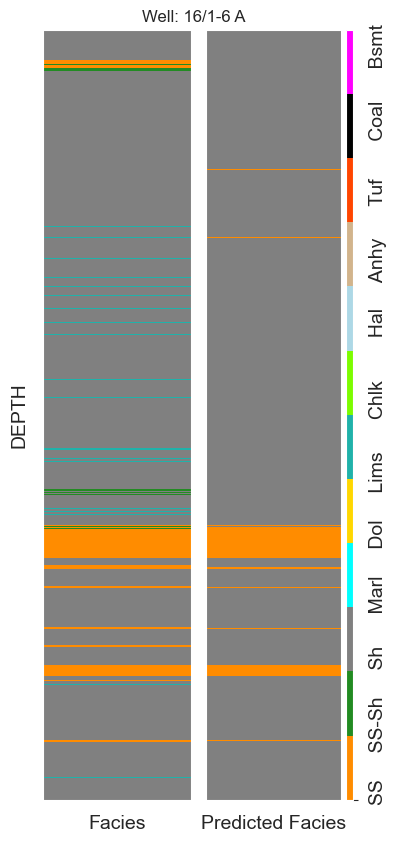

In [49]:
compare_facies(results_df[results_df['WELL'] == test_wells[well_no]], test_wells[well_no], 'LR_predictions')

Сохранение модели

In [121]:
with open('model_logreg.pkl', 'wb') as f:
    pickle.dump(model_logreg, f)

In [ ]:
from sklearn.svm import SVC

# Создание модели SVM с заданными параметрами
model_svm = SVC()

# Обучение модели на тренировочных данных
model_svm.fit(X_train, y_train)


In [ ]:
# Получение предсказаний на тренировочных данных
svm_train_preds = model_svm.predict(X_train)

# Вывод точности на тренировочной выборке
svm_train_accuracy = accuracy_score(y_train, svm_train_preds)
print(f"Accuracy на тренировочной выборке: {svm_train_accuracy:.3f}")

In [ ]:
# Получение предсказаний на тестовых данных
svm_test_preds = model_svm.predict(X_test)

# Вывод точности на тестовой выборке
svm_test_accuracy = accuracy_score(y_test, svm_test_preds)
print(f"Accuracy на тестовой выборке: {svm_test_accuracy:.3f}")


In [ ]:
# Вывод отчета о классификации на валидационной выборке
print(classification_report(y_test, svm_test_preds, digits=3, zero_division=1))

### 4.2 Решающее дерево

In [120]:
model_tree = DecisionTreeClassifier(random_state=42)

Обучение решающего дерева

In [121]:
%%time
model_tree.fit(X_train, y_train)

Wall time: 26.8 s


DecisionTreeClassifier(random_state=42)

Точность на тренировочной и тестовой выборках

In [122]:
DTC_train_preds = model_tree.predict(X_train)

In [123]:
DTC_train_accuracy = accuracy_score(DTC_train_preds, y_train)
print(f"Accuracy на тренировочной выборке: {DTC_train_accuracy:.3f}")

Accuracy на тренировочной выборке: 1.000


In [124]:
DTC_train_probs = model_tree.predict_proba(X_train)

In [125]:
DTC_train_probs

array([[0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]])

In [129]:
DTC_test_preds = model_tree.predict(X_test)

In [130]:
DTC_test_accuracy = accuracy_score(y_test, DTC_test_preds)
print(f"Accuracy на тестовой выборке: {DTC_test_accuracy:.3f}")

Accuracy на валидационной выборке: 0.544


In [131]:
print(classification_report(y_test, DTC_test_preds))

                 precision    recall  f1-score   support

      Anhydrite       0.12      0.05      0.07       299
          Chalk       0.32      0.06      0.11      5129
           Coal       0.12      0.48      0.19        58
       Dolomite       0.00      0.02      0.01       188
         Halite       0.00      0.00      0.00      4314
      Limestone       0.35      0.37      0.36      8839
           Marl       0.08      0.06      0.07      2702
      Sandstone       0.26      0.45      0.33     12675
Sandstone/Shale       0.08      0.15      0.11      5737
          Shale       0.81      0.71      0.76     71343
           Tuff       0.05      0.17      0.08      1181

       accuracy                           0.54    112465
      macro avg       0.20      0.23      0.19    112465
   weighted avg       0.59      0.54      0.56    112465



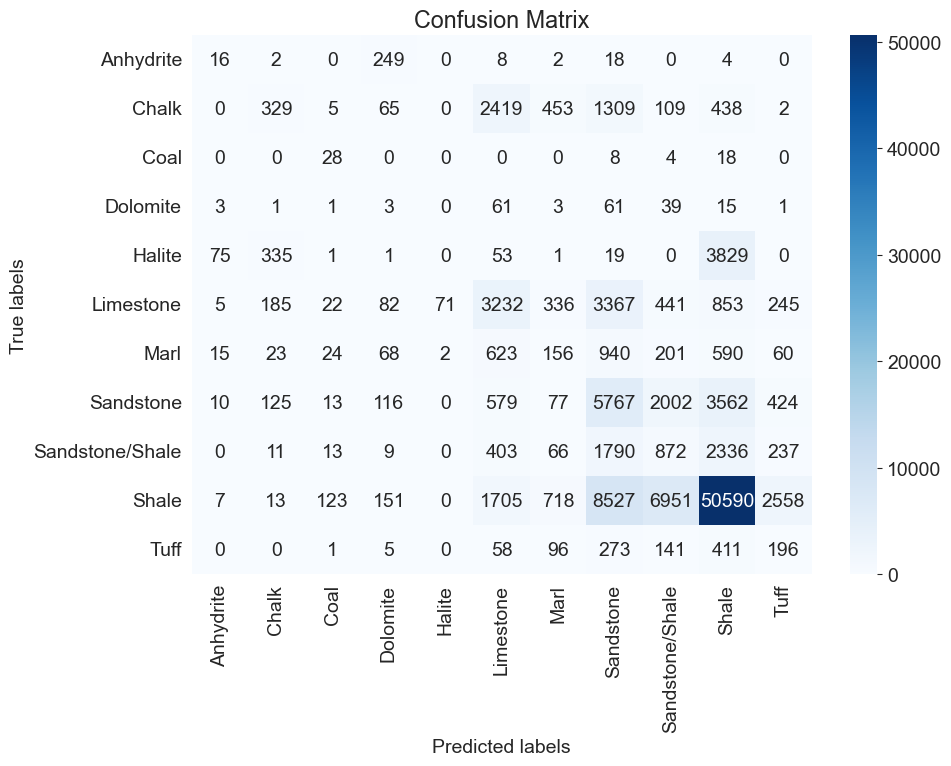

In [132]:
# Создание матрицы ошибок
conf_matrix = confusion_matrix(y_test, DTC_test_preds)

conf_df = pd.DataFrame(conf_matrix, index = model_tree.classes_, columns = model_tree.classes_)

# Визуализация матрицы ошибок с помощью heatmap
plt.figure(figsize=(10,7))
sns.heatmap(conf_df, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

Ограничим глубину дерева

In [50]:
model_tree2 = DecisionTreeClassifier(max_depth=8, random_state=42)

In [51]:
%%time
model_tree2.fit(X_train, y_train)

Wall time: 32.7 s


DecisionTreeClassifier(max_depth=8, random_state=42)

Точность на тренировочной и тестовой выборках

In [52]:
DTC2_train_preds = model_tree2.predict(X_train)
DTC2_train_accuracy = accuracy_score(DTC2_train_preds, y_train)
print(f"Accuracy на тренировочной выборке: {DTC2_train_accuracy:.3f}")

Accuracy на тренировочной выборке: 0.763


In [53]:
DTC2_test_preds = model_tree2.predict(X_test)

In [54]:
DTC2_test_preds

array(['Shale', 'Shale', 'Shale', ..., 'Shale', 'Shale', 'Shale'],
      dtype=object)

In [55]:
DTC2_test_accuracy = accuracy_score(y_test, DTC2_test_preds)
print(f"Accuracy на тестовой выборке: {DTC2_test_accuracy:.3f}")

Accuracy на тестовой выборке: 0.714


Отчет о классификации на тестовой выборке

In [56]:
print(classification_report(y_test, DTC2_test_preds, digits=3, zero_division=1))

                 precision    recall  f1-score   support

      Anhydrite      0.985     0.695     0.815       374
          Chalk      0.312     0.077     0.123      5129
           Coal      0.154     0.103     0.124        58
       Dolomite      1.000     0.000     0.000       188
         Halite      1.000     0.000     0.000      4314
      Limestone      0.388     0.474     0.427     11912
           Marl      0.401     0.069     0.118      4968
      Sandstone      0.505     0.665     0.574     15794
Sandstone/Shale      0.207     0.158     0.179      6573
          Shale      0.863     0.933     0.897     82390
           Tuff      0.000     0.000     0.000      1498

       accuracy                          0.714    133198
      macro avg      0.529     0.289     0.296    133198
   weighted avg      0.702     0.714     0.681    133198



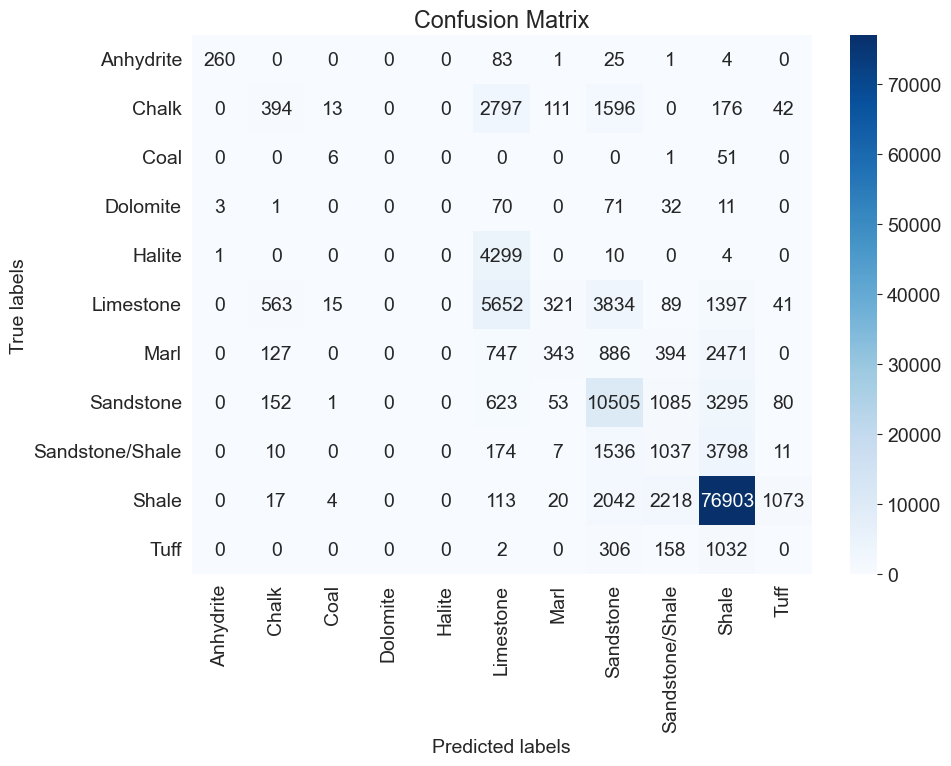

In [57]:
# Создание матрицы ошибок
conf_matrix = confusion_matrix(y_test, DTC2_test_preds)

conf_df = pd.DataFrame(conf_matrix, index = model_tree2.classes_, columns = model_tree2.classes_)

# Визуализация матрицы ошибок с помощью heatmap
plt.figure(figsize=(10,7))
sns.heatmap(conf_df, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [58]:
results_df['DT_predictions'] = model_tree2.predict(X_test)
results_df['DT_predictions'] = results_df['DT_predictions'].map(lithology_keys).map(lithology_numbers)

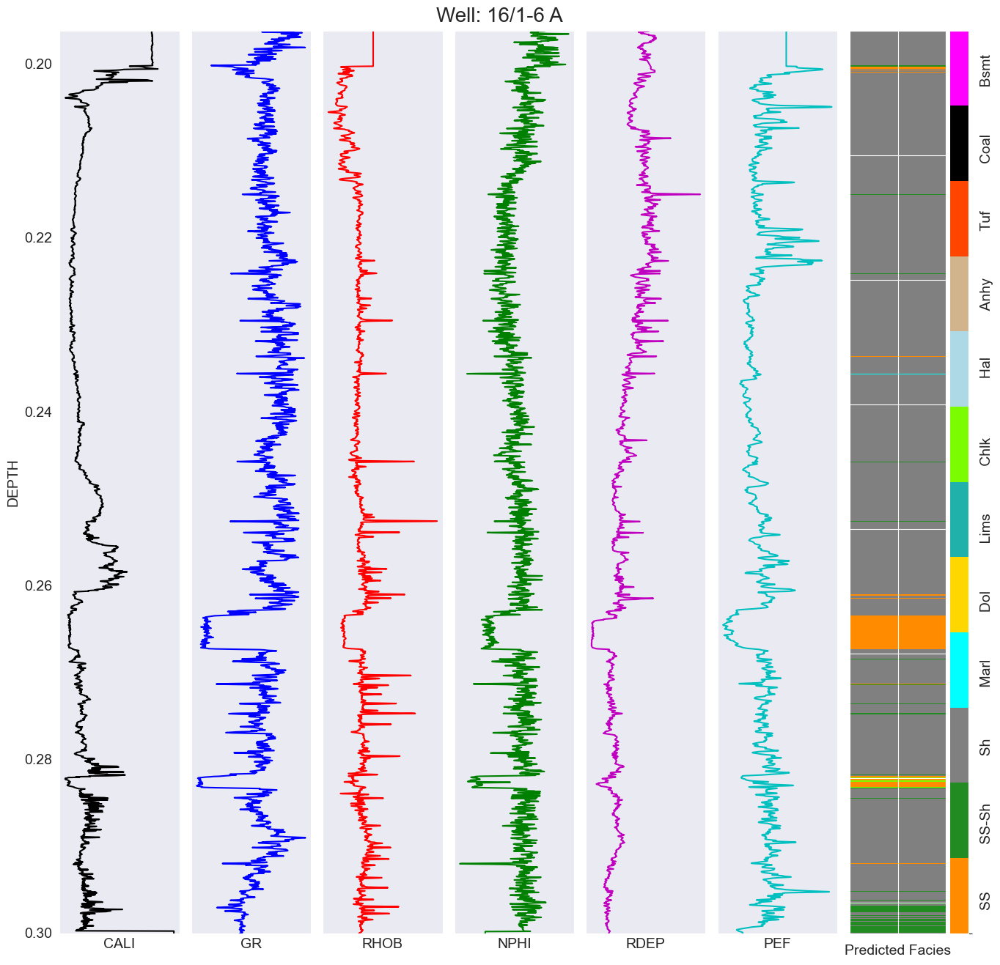

In [59]:
log_plot(results_df[results_df['WELL'] == test_wells[well_no]], selected_logs, test_wells[well_no], 'DT_predictions')

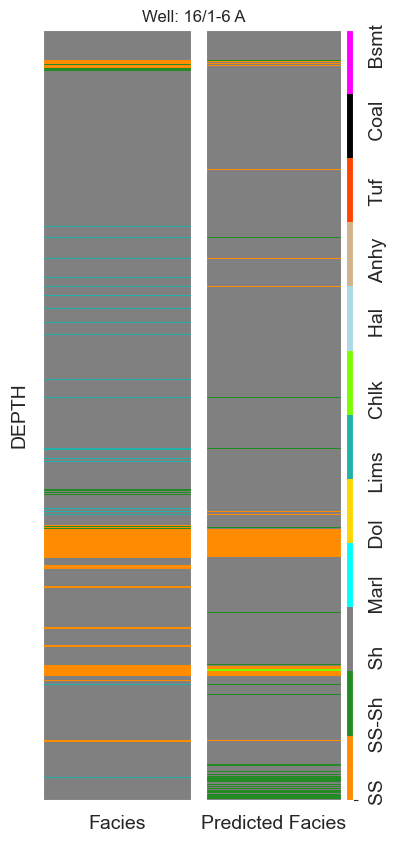

In [60]:
compare_facies(results_df[results_df['WELL'] == test_wells[well_no]], test_wells[well_no], 'DT_predictions')

Сохранение модели

In [123]:
with open('model_DT.pkl', 'wb') as f:
    pickle.dump(model_tree2, f)

### 4.3 Случайный лес

In [219]:
%%time

RF_model = RandomForestClassifier()

RF_params = {
    'n_estimators': [100, 200, 500, 700],  # количество деревьев в лесу
    'criterion': ['gini', 'entropy'],  # критерий разделения
    'max_depth': [None, 10, 20, 30, 40, 50],  # максимальная глубина дерева
    'min_samples_split': [2, 5, 10],  # минимальное количество выборок для разделения узла
    'min_samples_leaf': [1, 2, 4],  # минимальное количество выборок в листовом узле
}

rs_randforest =  RandomizedSearchCV(estimator=RF_model, param_distributions=RF_params, cv=3, scoring='accuracy', n_iter=10, random_state=42)

rs_randforest.fit(X_train, y_train)

Wall time: 9h 53s


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 10, 20, 30, 40, 50],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 500, 700]},
                   random_state=42, scoring='accuracy')

In [223]:
rs_randforest.best_params_

{'n_estimators': 700,
 'min_samples_split': 10,
 'min_samples_leaf': 2,
 'max_depth': 10,
 'criterion': 'entropy'}

In [128]:
model_randomforest = RandomForestClassifier()

In [225]:
model_randomforest.set_params(**rs_randforest.best_params_)

RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2,
                       min_samples_split=10, n_estimators=700)

In [129]:
%%time
model_randomforest.fit(X_train, y_train)

RandomForestClassifier()

In [130]:
RF_train_preds = model_randomforest.predict(X_train)
RF_train_preds

array(['Shale', 'Shale', 'Shale', ..., 'Sandstone/Shale',
       'Sandstone/Shale', 'Sandstone/Shale'], dtype=object)

In [131]:
accuracy_score(RF_train_preds, y_train)

0.9999922870007039

In [132]:
test_preds_ranfor = model_randomforest.predict(X_test)

In [232]:
test_preds_ranfor

array(['Shale', 'Shale', 'Shale', ..., 'Shale', 'Shale', 'Shale'],
      dtype=object)

In [133]:
accuracy_score(test_preds_ranfor, y_test)

0.740889502845388

In [135]:
model_randomforest.score(X_test, y_test)

0.740889502845388

In [138]:
print(classification_report(y_test, test_preds_ranfor, digits = 3))

                 precision    recall  f1-score   support

      Anhydrite      0.985     0.698     0.817       374
          Chalk      0.784     0.033     0.064      5129
           Coal      0.594     0.655     0.623        58
       Dolomite      0.000     0.000     0.000       188
         Halite      1.000     0.011     0.022      4314
      Limestone      0.443     0.563     0.496     11912
           Marl      0.563     0.058     0.106      4968
      Sandstone      0.481     0.688     0.566     15794
Sandstone/Shale      0.181     0.020     0.036      6573
          Shale      0.858     0.971     0.911     82390
           Tuff      0.499     0.138     0.216      1498

       accuracy                          0.741    133198
      macro avg      0.581     0.349     0.351    133198
   weighted avg      0.729     0.741     0.689    133198



In [139]:
with open('model_randomforest.pkl', 'wb') as f:
    pickle.dump(model_randomforest, f)

### 4.5 X-GB Classifier

In [61]:
#Кодирование целевой переменной в числовые значения
y_train_encoded = y_train.map(lithology_keys).map(lithology_numbers)

y_test_encoded = y_test.map(lithology_keys).map(lithology_numbers)

In [62]:
model_XGboost = XGBClassifier(random_state=42)

In [481]:
%%time

XGboost_params = {
    'n_estimators': [100, 200, 300, 350],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.3]
}

gs_XGboost = RandomizedSearchCV(estimator=model_XGboost, param_distributions=XGboost_params, cv=3, scoring='accuracy', n_jobs=-1)

gs_XGboost.fit(X_train, y_train_encoded)

ValueError: Found input variables with inconsistent numbers of samples: [1011072, 1057943]

In [ ]:
gs_XGboost.best_params_

In [221]:
gs_XGboost.best_params_

{'n_estimators': 300, 'max_depth': 6, 'learning_rate': 0.01}

In [83]:
gs_XGboost.best_estimator_.score(inputs_train, targets_train_encoded)

0.718678847244036

In [63]:
XGboost_best_params = {'n_estimators': 100,
                       'max_depth': 3,
                       'learning_rate': 0.01}

In [64]:
model_XGboost.set_params(**XGboost_best_params)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [65]:
%%time
model_XGboost.fit(X_train, y_train_encoded)

Wall time: 1min 1s


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

Оценка метрик на обучающих и валидационных выборках

In [103]:
XGboost_train_preds = model_XGboost.predict(X_train)

In [104]:
XGB_train_accuracy = accuracy_score(XGboost_train_preds, y_train_encoded)
print(f"Accuracy на тренировочной выборке: {XGB_train_accuracy:.3f}")

Accuracy на тренировочной выборке: 0.713


In [105]:
XGboost_test_preds = model_XGboost.predict(X_test)

In [106]:
XGB_test_accuracy = accuracy_score(XGboost_test_preds, y_test_encoded)
print(f"Accuracy на тестовой выборке: {XGB_test_accuracy:.3f}")

Accuracy на тестовой выборке: 0.735


Отчет о классификации

In [68]:
print(classification_report(y_test_encoded, XGboost_test_preds, digits = 3, zero_division = 1))

              precision    recall  f1-score   support

           0      0.466     0.578     0.516     15794
           1      0.037     0.002     0.004      6573
           2      0.825     0.988     0.899     82390
           3      1.000     0.000     0.000      4968
           4      1.000     0.000     0.000       188
           5      0.448     0.486     0.466     11912
           6      0.977     0.246     0.393      5129
           7      1.000     0.000     0.000      4314
           8      0.985     0.706     0.822       374
           9      1.000     0.000     0.000      1498
          10      0.474     0.466     0.470        58

    accuracy                          0.735    133198
   macro avg      0.746     0.316     0.325    133198
weighted avg      0.730     0.735     0.677    133198



Матрица ошибок

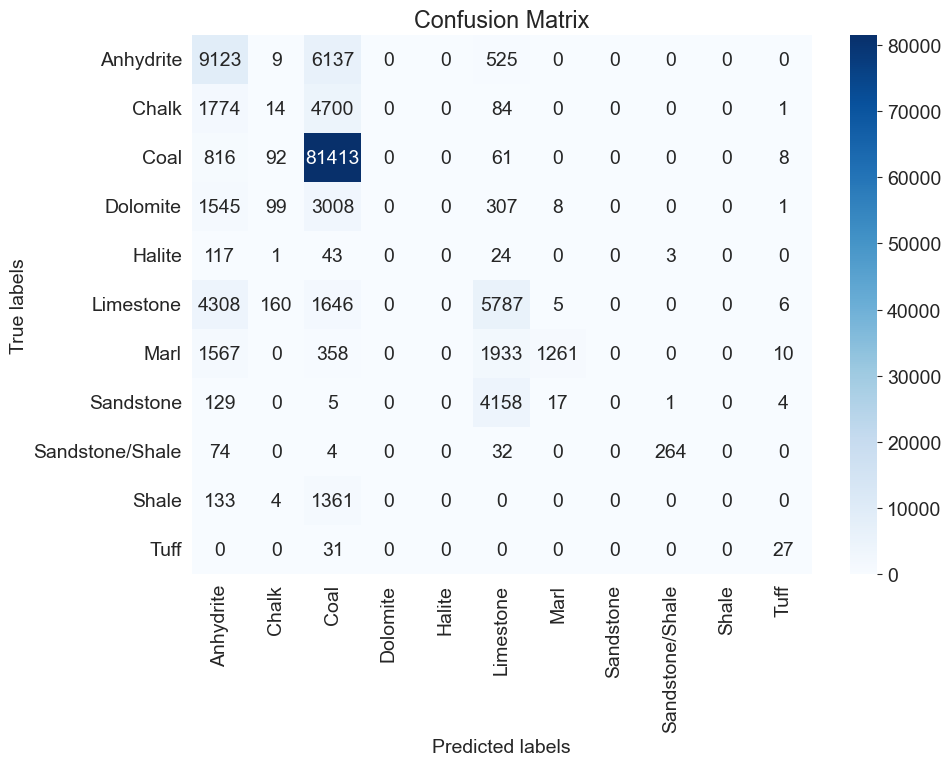

In [161]:
conf_matrix = confusion_matrix(y_test_encoded, XGboost_test_preds)

classes = ['Anhydrite', 'Chalk', 'Coal', 'Dolomite', 'Halite', 'Limestone',
       'Marl', 'Sandstone', 'Sandstone/Shale', 'Shale', 'Tuff']

conf_df = pd.DataFrame(conf_matrix, index=classes, columns=classes)

# Визуализация матрицы ошибок с помощью heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(conf_df, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [70]:
feature_importances = model_XGboost.feature_importances_
feature_names = X_train.columns

feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Сортировка признаков по важности в убывающем порядке
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print(feature_importance_df)

     Feature  Importance
6         GR    0.228441
10      NPHI    0.152862
1       CALI    0.131429
9         BS    0.114422
8        DTC    0.093005
3       RMED    0.067157
5       RHOB    0.060291
7        PEF    0.051017
0   DEPTH_MD    0.038133
4       RDEP    0.032202
2       RSHA    0.022766
11        SP    0.008275


Визуализация результатов классификации

In [71]:
results_df['XGboost_predictions'] = model_XGboost.predict(X_test)

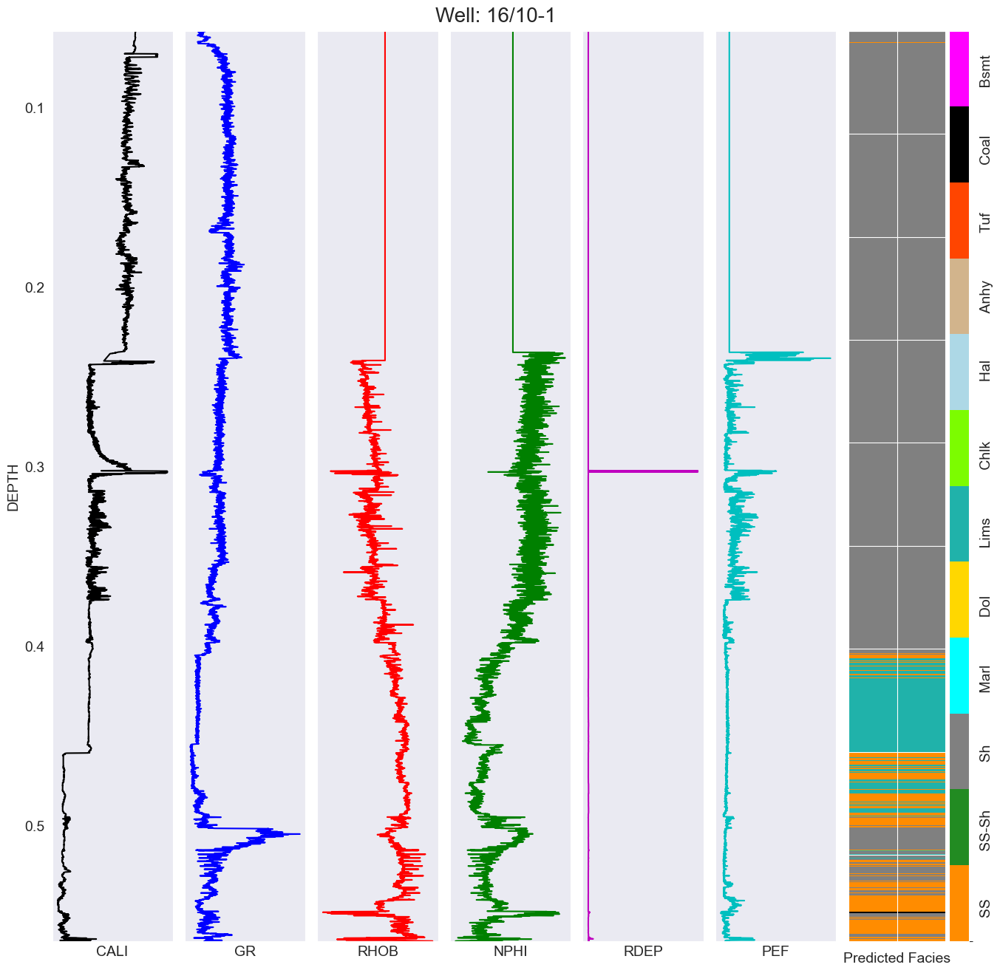

In [72]:
well_no = 5

log_plot(results_df[results_df['WELL'] == test_wells[well_no]], selected_logs, test_wells[well_no], 'XGboost_predictions')

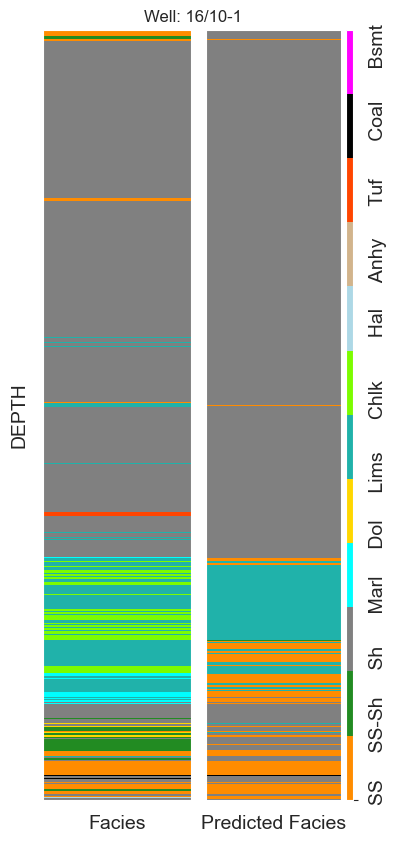

In [73]:
compare_facies(results_df[results_df['WELL'] == test_wells[well_no]], test_wells[well_no], 'XGboost_predictions')

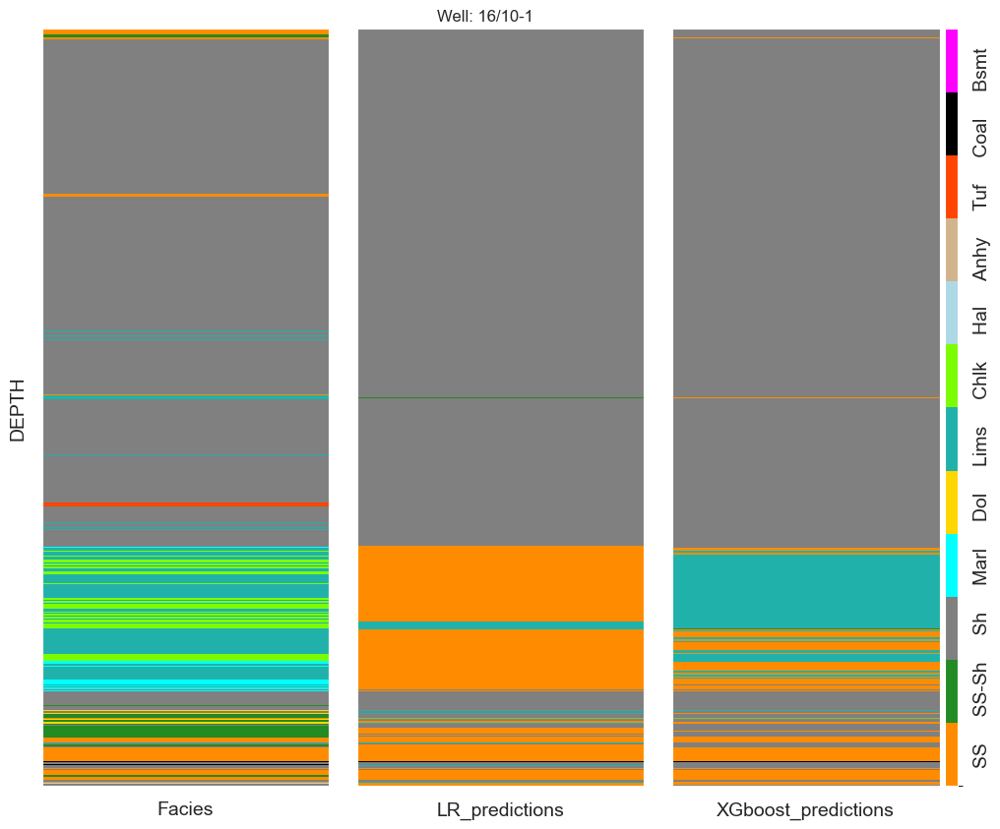

In [74]:
compare_all_facies(results_df[results_df['WELL'] == test_wells[well_no]], test_wells[well_no], ['LR_predictions', 'XGboost_predictions'])

Сохранение модели

In [120]:
import pickle

with open('xgboost_model.pkl', 'wb') as f:
    pickle.dump(model_XGboost, f)


In [183]:
clf_xgboost = xgb.XGBClassifier(
                                n_estimators = 108,
                                learning_rate = 0.058341077396837984,
                                max_depth = 10,
                                min_child_weight = 3.975751644687145,
                                gamma = 3.2978917680925592,
                                subsample = 0.660954379979485,
                                colsample_bytree = 0.35601189656690413
                                )

In [185]:
clf_xgboost.fit(X_train, y_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.35601189656690413, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=3.2978917680925592,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.058341077396837984,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=3.975751644687145, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=108,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

In [186]:
train_preds_clf_xgboost = clf_xgboost.predict(X_train)
train_preds_clf_xgboost

array([9, 9, 9, ..., 8, 8, 9], dtype=int64)

In [187]:
accuracy_score(train_preds_clf_xgboost, y_train_encoded)

0.8380161655615258

In [181]:
clf_xgboost.score(inputs_train, y_train)

0.8291776251591498

In [188]:
val_preds_clf_xgboost = clf_xgboost.predict(X_val)
val_preds_clf_xgboost

array([9, 9, 9, ..., 9, 9, 9], dtype=int64)

In [ ]:
accuracy_score(test_preds_clf_xgboost, targets_val)

In [ ]:
clf_xgboost.score(inputs_val, targets_val)

### 4.6 LGBM Classifier

In [75]:
param = {'num_leaves': 150, #120,
         'num_iterations': 500, #400,
         'max_depth': 15,
         'learning_rate': 0.05,
         'feature_fraction': 0.4, #0.5,
         'class_weight': None,
         'bagging_fraction': 0.9 #0.8
        }

In [76]:
model_lgbm = lgbm.LGBMClassifier(random_seed = 42)

In [77]:
model_lgbm.set_params(**param)

LGBMClassifier(bagging_fraction=0.9, feature_fraction=0.4, learning_rate=0.05,
               max_depth=15, num_iterations=500, num_leaves=150,
               random_seed=42)

Обучение LGBM Classifier

In [78]:
%%time
model_lgbm.fit(X_train, y_train)

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.113163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2820
[LightGBM] [Info] Number of data points in the train set: 1037210, number of used features: 12
[LightGBM] [Info] Start training from score -7.285373
[LightGBM] [Info] Start training from score -5.260858
[LightGBM] [Info] Start training from score -5.619339
[LightGBM] [Info] Start training from score -6.538825
[LightGBM] 

LGBMClassifier(bagging_fraction=0.9, feature_fraction=0.4, learning_rate=0.05,
               max_depth=15, num_iterations=500, num_leaves=150,
               random_seed=42)

Получение предсказаний

In [79]:
LGBM_train_preds = model_lgbm.predict(X_train)

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9


In [80]:
LGBM_val_preds = model_lgbm.predict(X_test)

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9


Точность на тренировочной и тестовой выборках

In [81]:
LGBM_train_accuracy = accuracy_score(LGBM_train_preds, y_train)
print(f"Accuracy на тренировочной выборке: {LGBM_train_accuracy:.3f}")

Accuracy на тренировочной выборке: 0.952


In [82]:
LGBM_test_accuracy = accuracy_score(LGBM_val_preds, y_test)
print(f"Accuracy на тестовой выборке: {LGBM_test_accuracy:.3f}")

Accuracy на тестовой выборке: 0.740


Отчет о классификации

In [83]:
print(classification_report(y_test, LGBM_val_preds, digits = 3))

                 precision    recall  f1-score   support

      Anhydrite      0.011     0.013     0.012       374
          Chalk      0.266     0.015     0.029      5129
           Coal      0.058     0.655     0.107        58
       Dolomite      0.003     0.027     0.006       188
         Halite      0.431     0.031     0.058      4314
      Limestone      0.471     0.661     0.550     11912
           Marl      0.292     0.062     0.102      4968
      Sandstone      0.589     0.729     0.652     15794
Sandstone/Shale      0.146     0.048     0.072      6573
          Shale      0.870     0.950     0.908     82390
           Tuff      0.135     0.059     0.082      1498

       accuracy                          0.740    133198
      macro avg      0.297     0.295     0.234    133198
   weighted avg      0.694     0.740     0.700    133198



Матрица ошибок

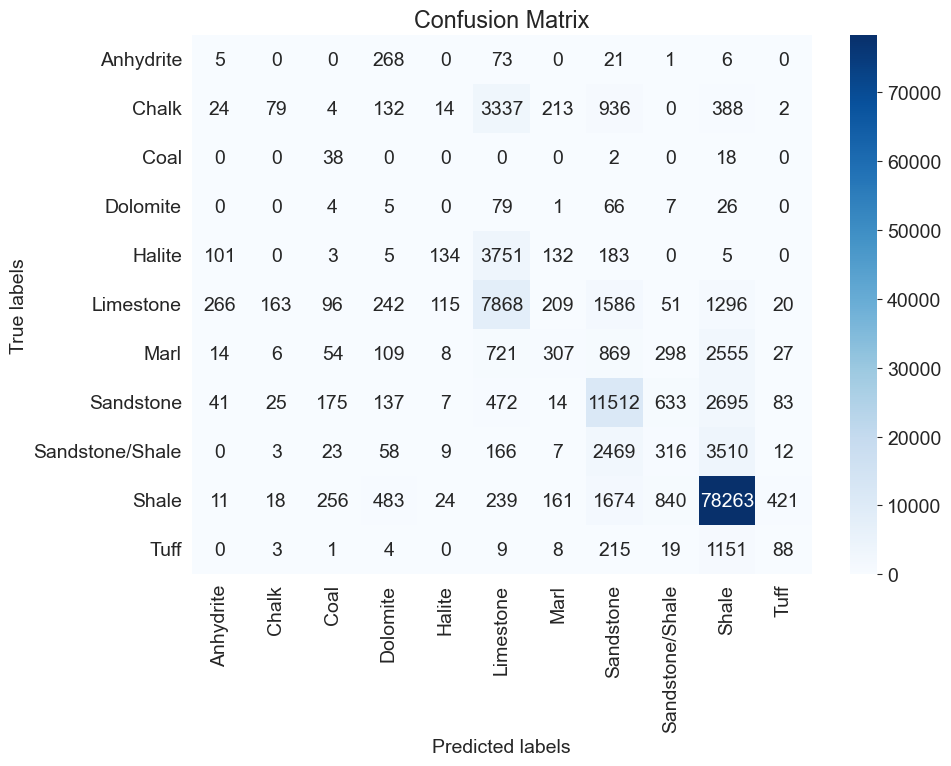

In [84]:
conf_matrix = confusion_matrix(y_test, LGBM_val_preds)

conf_df = pd.DataFrame(conf_matrix, index=model_lgbm.classes_, columns=model_lgbm.classes_)

# Визуализация матрицы ошибок с помощью heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(conf_df, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [85]:
results_df['LGBM_predictions'] = LGBM_val_preds
results_df['LGBM_predictions'] = results_df['LGBM_predictions'].map(lithology_keys).map(lithology_numbers)

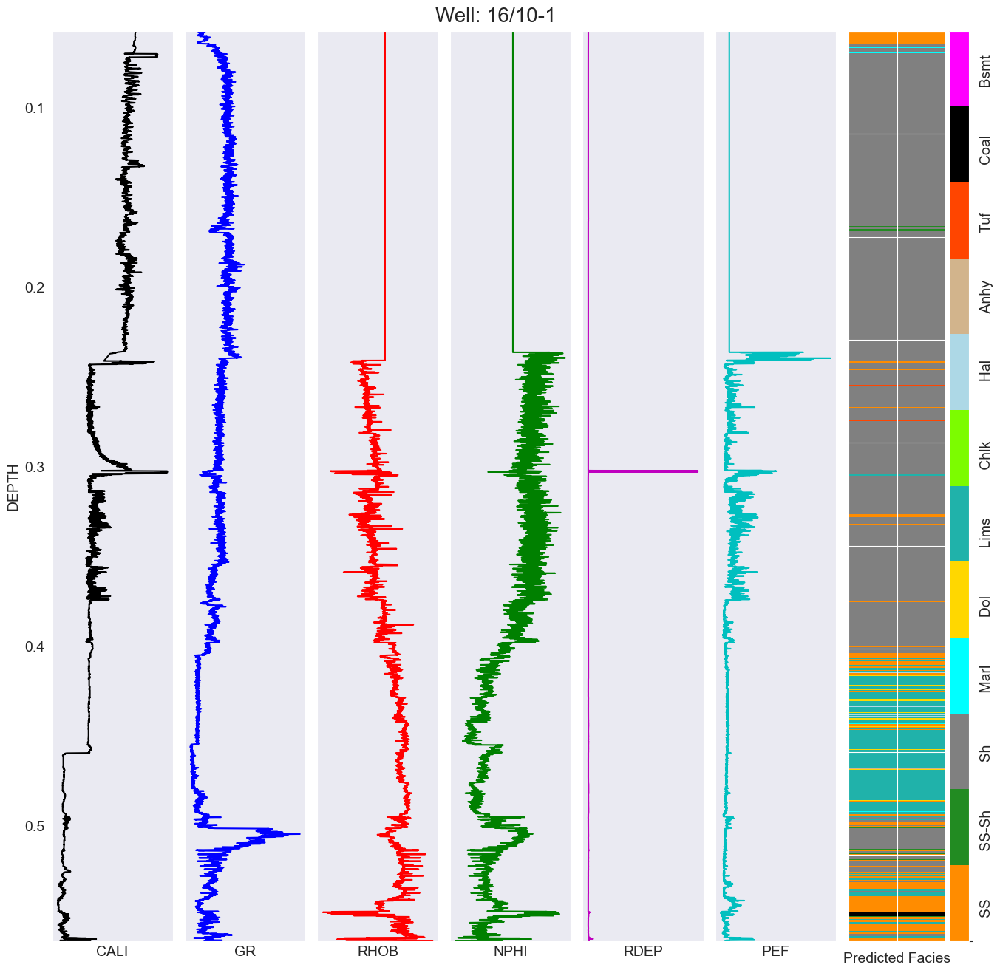

In [86]:
well_no = 5

log_plot(results_df[results_df['WELL'] == test_wells[well_no]], selected_logs, test_wells[well_no], 'LGBM_predictions')

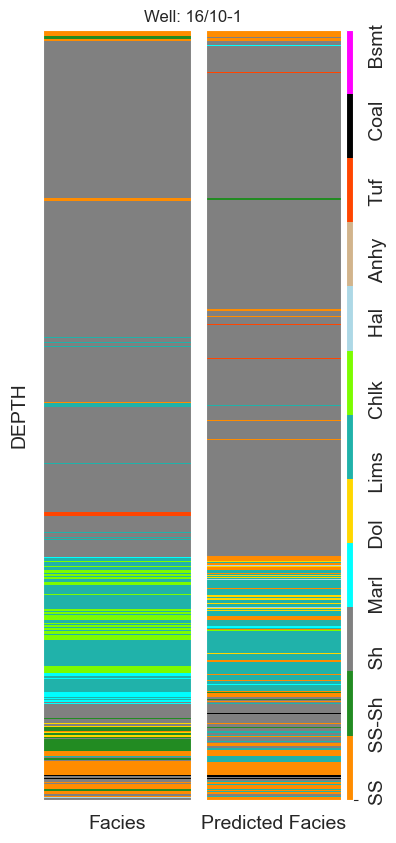

In [87]:
compare_facies(results_df[results_df['WELL'] == test_wells[well_no]], test_wells[well_no], 'LGBM_predictions')

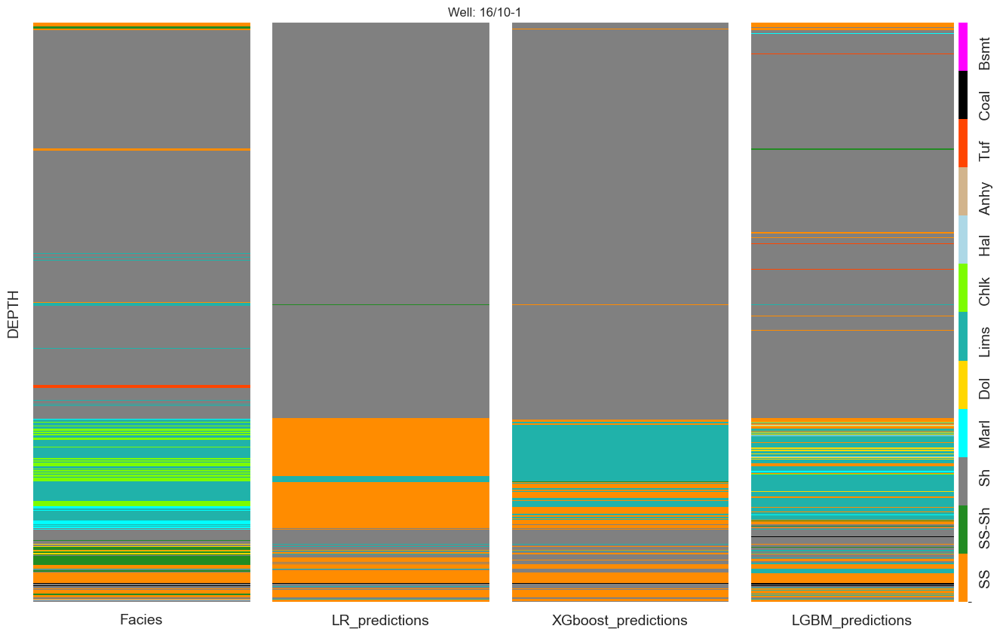

In [88]:
compare_all_facies(results_df[results_df['WELL'] == test_wells[well_no]], test_wells[well_no], ['LR_predictions', 'XGboost_predictions', 'LGBM_predictions'])

Сохранение модели

In [122]:
with open('model_lgbm.pkl', 'wb') as f:
    pickle.dump(model_lgbm, f)

### 4.7 Catboost Classifier

In [90]:
catboost_model = CatBoostClassifier(random_seed = 42)

In [482]:
%%time

CatBoost_params = {
    'iterations': [1200, 300, 400, 500],  # количество итераций
    'learning_rate': [0.01, 0.05, 0.1],  # скорость обучения
    'depth': [4, 6, 8],  # глубина деревьев
    'border_count': [32, 64, 128],  # число бинов для числовых признаков
}


rs_catboost =  RandomizedSearchCV(estimator=catboost_classifier, param_distributions=CatBoost_params, cv=3, scoring='accuracy', n_iter=10, random_state=42)

rs_catboost.fit(X_train, y_train)

NameError: name 'inputs_train' is not defined

In [483]:
rs_catboost.best_params_

AttributeError: 'RandomizedSearchCV' object has no attribute 'best_params_'

In [91]:
catboost_best_params = {'learning_rate': 0.01,
          'l2_leaf_reg': 1,
          'iterations': 400,
          'depth': 4,
          'border_count': 64}

catboost_model.set_params(**catboost_best_params)

In [92]:
%%time
catboost_model.fit(X_train, y_train)

0:	learn: 2.3491694	total: 762ms	remaining: 5m 4s
1:	learn: 2.3039754	total: 1.25s	remaining: 4m 8s
2:	learn: 2.2621564	total: 1.75s	remaining: 3m 52s
3:	learn: 2.2232080	total: 2.23s	remaining: 3m 40s
4:	learn: 2.1865206	total: 2.68s	remaining: 3m 31s
5:	learn: 2.1520101	total: 3.14s	remaining: 3m 26s
6:	learn: 2.1194312	total: 3.67s	remaining: 3m 25s
7:	learn: 2.0885961	total: 4.18s	remaining: 3m 24s
8:	learn: 2.0591102	total: 4.69s	remaining: 3m 23s
9:	learn: 2.0312242	total: 5.15s	remaining: 3m 20s
10:	learn: 2.0046653	total: 5.64s	remaining: 3m 19s
11:	learn: 1.9791915	total: 6.14s	remaining: 3m 18s
12:	learn: 1.9546087	total: 6.69s	remaining: 3m 19s
13:	learn: 1.9312051	total: 7.25s	remaining: 3m 19s
14:	learn: 1.9088861	total: 7.74s	remaining: 3m 18s
15:	learn: 1.8873612	total: 8.25s	remaining: 3m 17s
16:	learn: 1.8667323	total: 8.72s	remaining: 3m 16s
17:	learn: 1.8463718	total: 9.23s	remaining: 3m 16s
18:	learn: 1.8272340	total: 9.7s	remaining: 3m 14s
19:	learn: 1.8083351	tota

158:	learn: 0.9878954	total: 1m 24s	remaining: 2m 7s
159:	learn: 0.9859823	total: 1m 24s	remaining: 2m 7s
160:	learn: 0.9840842	total: 1m 25s	remaining: 2m 6s
161:	learn: 0.9822026	total: 1m 25s	remaining: 2m 6s
162:	learn: 0.9803631	total: 1m 26s	remaining: 2m 5s
163:	learn: 0.9784415	total: 1m 26s	remaining: 2m 4s
164:	learn: 0.9766373	total: 1m 27s	remaining: 2m 4s
165:	learn: 0.9748771	total: 1m 27s	remaining: 2m 3s
166:	learn: 0.9730629	total: 1m 28s	remaining: 2m 3s
167:	learn: 0.9713086	total: 1m 29s	remaining: 2m 2s
168:	learn: 0.9694862	total: 1m 29s	remaining: 2m 2s
169:	learn: 0.9679660	total: 1m 30s	remaining: 2m 1s
170:	learn: 0.9660843	total: 1m 30s	remaining: 2m 1s
171:	learn: 0.9643489	total: 1m 31s	remaining: 2m
172:	learn: 0.9626350	total: 1m 31s	remaining: 2m
173:	learn: 0.9611720	total: 1m 32s	remaining: 1m 59s
174:	learn: 0.9596970	total: 1m 32s	remaining: 1m 59s
175:	learn: 0.9581362	total: 1m 33s	remaining: 1m 58s
176:	learn: 0.9565071	total: 1m 33s	remaining: 1m

312:	learn: 0.8297845	total: 2m 45s	remaining: 46s
313:	learn: 0.8292421	total: 2m 46s	remaining: 45.5s
314:	learn: 0.8287279	total: 2m 46s	remaining: 45s
315:	learn: 0.8282174	total: 2m 47s	remaining: 44.4s
316:	learn: 0.8275658	total: 2m 47s	remaining: 43.9s
317:	learn: 0.8270570	total: 2m 48s	remaining: 43.4s
318:	learn: 0.8265851	total: 2m 48s	remaining: 42.8s
319:	learn: 0.8258760	total: 2m 49s	remaining: 42.3s
320:	learn: 0.8254876	total: 2m 49s	remaining: 41.8s
321:	learn: 0.8249516	total: 2m 50s	remaining: 41.2s
322:	learn: 0.8243355	total: 2m 50s	remaining: 40.7s
323:	learn: 0.8238338	total: 2m 51s	remaining: 40.2s
324:	learn: 0.8233984	total: 2m 51s	remaining: 39.7s
325:	learn: 0.8228834	total: 2m 52s	remaining: 39.1s
326:	learn: 0.8221290	total: 2m 53s	remaining: 38.6s
327:	learn: 0.8215846	total: 2m 53s	remaining: 38.1s
328:	learn: 0.8211498	total: 2m 54s	remaining: 37.6s
329:	learn: 0.8206498	total: 2m 54s	remaining: 37s
330:	learn: 0.8202255	total: 2m 55s	remaining: 36.5s

Получение предсказаний

In [93]:
CB_train_preds = catboost_model.predict(X_train)

In [94]:
CB_test_preds = catboost_model.predict(X_test)

Точность на тренировочной и тестовой выборках

In [95]:
CB_train_accuracy = accuracy_score(CB_train_preds, y_train)
print(f"Accuracy на тренировочной выборке: {CB_train_accuracy:.3f}")

Accuracy на тренировочной выборке: 0.735


In [96]:
CB_test_accuracy = accuracy_score(CB_test_preds, y_test)
print(f"Accuracy на тестовой выборке: {CB_test_accuracy:.3f}")

Accuracy на тестовой выборке: 0.741


In [97]:
print(classification_report(y_test, CB_test_preds, digits = 3, zero_division = 1))

                 precision    recall  f1-score   support

      Anhydrite      1.000     0.000     0.000       374
          Chalk      1.000     0.000     0.000      5129
           Coal      0.789     0.517     0.625        58
       Dolomite      1.000     0.000     0.000       188
         Halite      0.400     0.000     0.001      4314
      Limestone      0.590     0.566     0.578     11912
           Marl      0.000     0.000     0.000      4968
      Sandstone      0.428     0.672     0.523     15794
Sandstone/Shale      0.392     0.037     0.068      6573
          Shale      0.842     0.984     0.908     82390
           Tuff      1.000     0.000     0.000      1498

       accuracy                          0.741    133198
      macro avg      0.677     0.253     0.246    133198
   weighted avg      0.711     0.741     0.679    133198



Матрица ошибок

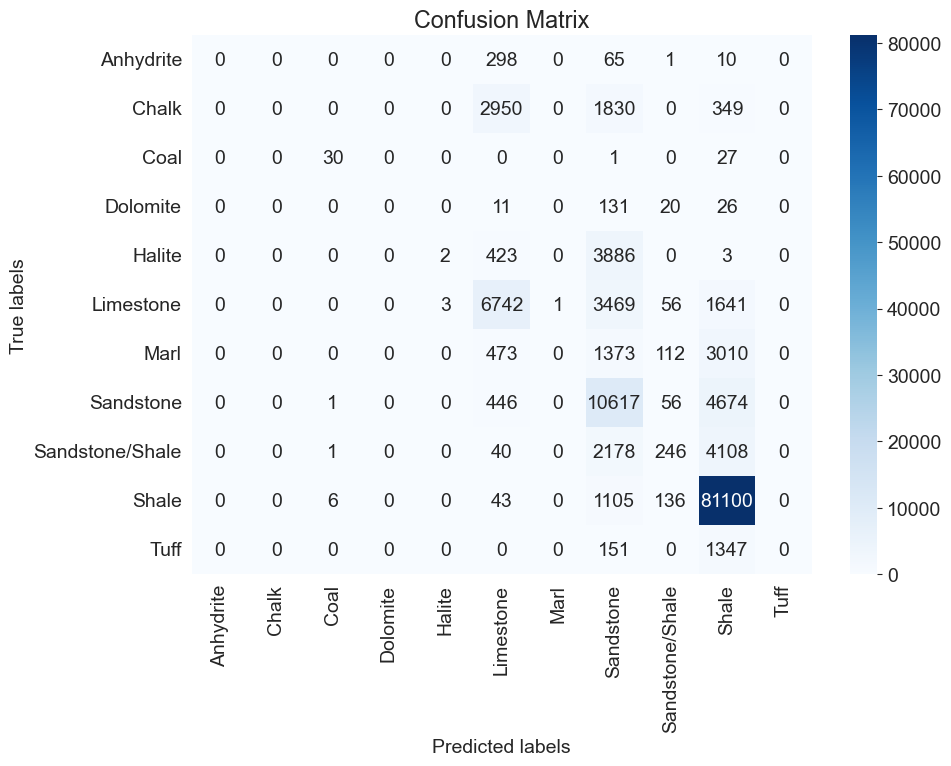

In [98]:
conf_matrix = confusion_matrix(y_test, CB_test_preds)

conf_df = pd.DataFrame(conf_matrix, index=catboost_model.classes_, columns=catboost_model.classes_)

# Визуализация матрицы ошибок с помощью heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(conf_df, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [99]:
results_df['CB_predictions'] = CB_test_preds
results_df['CB_predictions'] = results_df['CB_predictions'].map(lithology_keys).map(lithology_numbers)

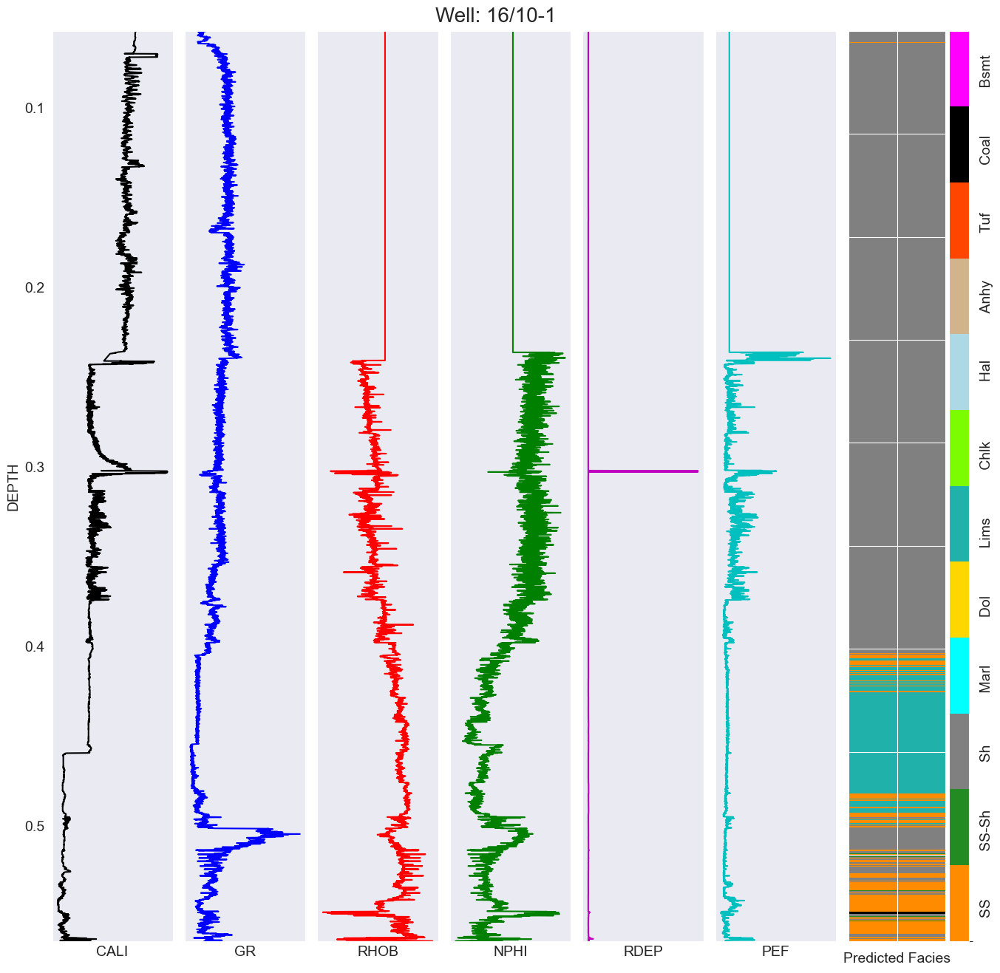

In [100]:
well_no = 5

log_plot(results_df[results_df['WELL'] == test_wells[well_no]], selected_logs, test_wells[well_no], 'CB_predictions')

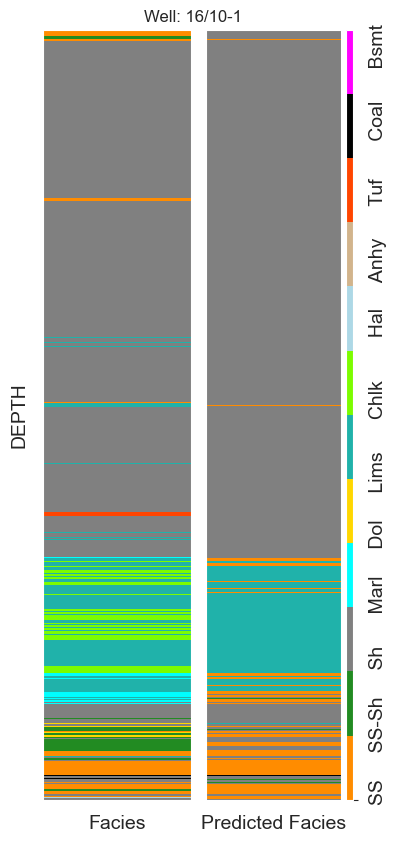

In [101]:
compare_facies(results_df[results_df['WELL'] == test_wells[well_no]], test_wells[well_no], 'CB_predictions')

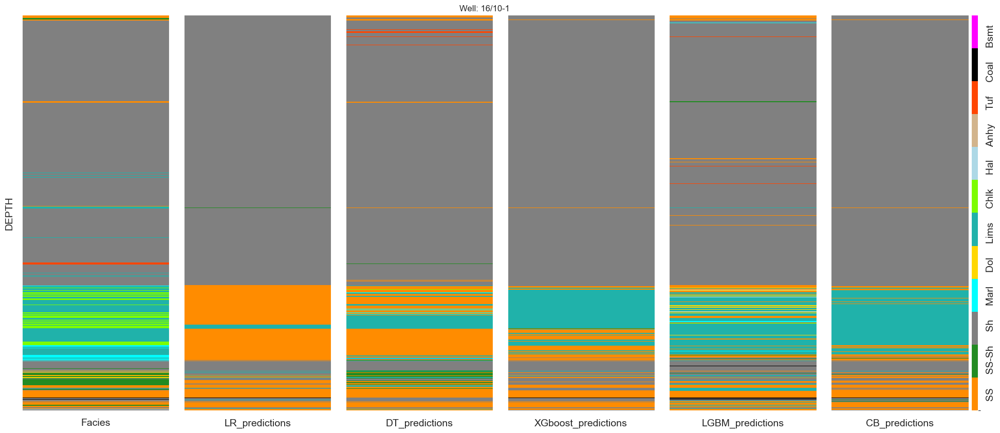

In [102]:
compare_all_facies(results_df[results_df['WELL'] == test_wells[well_no]], test_wells[well_no], ['LR_predictions', 'DT_predictions', 'XGboost_predictions','LGBM_predictions', 'CB_predictions'])

Сохранение модели

In [123]:
with open('catboost_model.pkl', 'wb') as f:
    pickle.dump(catboost_model, f)

## 5. Подсчет и сравнение метрик

### 5.1.1 Accuracy 

#### 5.1.1 Accuracy на тренировочной выборке

In [128]:
models = ['Logistic Regression', 'Decision Tree', 'LightGBM', 'XGBoost', 'CatBoost']
accuracy_scores_train = [LR_train_accuracy, DTC2_train_accuracy, LGBM_train_accuracy, XGB_train_accuracy, CB_train_accuracy]

results_accuracy_train = pd.DataFrame({'Model': models, 'Accuracy_Score': accuracy_scores_train})
sorted_result_accuracy_train = results_accuracy_train.sort_values(by='Accuracy_Score', ascending=False).reset_index(drop=True)

sorted_result_accuracy_train

,Model,Accuracy_Score
0,LightGBM,0.951749
1,Decision Tree,0.763115
2,CatBoost,0.734696
3,XGBoost,0.713283
4,Logistic Regression,0.702045


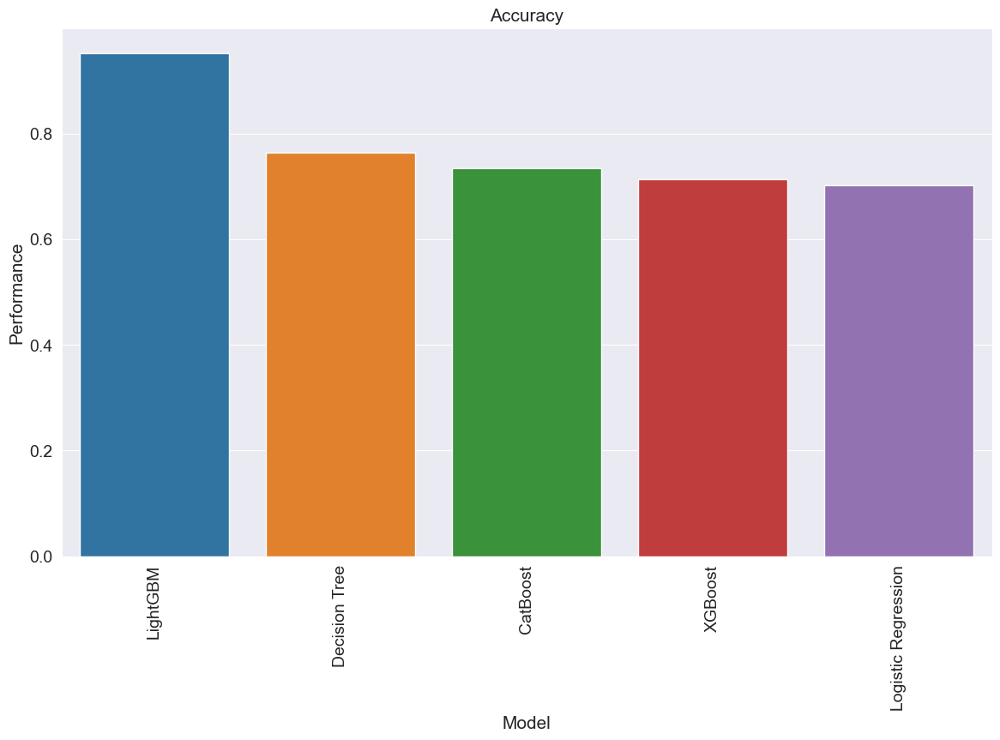

In [129]:
f, ax = plt.subplots(figsize=(14,8))
plt.xticks(rotation='90')
sns.barplot(x=sorted_result_accuracy_train['Model'], y=sorted_result_accuracy_train['Accuracy_Score'])
plt.xlabel('Model', fontsize=15)
plt.ylabel('Performance', fontsize=15)
plt.title('Accuracy', fontsize=15)
plt.show()

#### 5.1.1 Accuracy на тестовой выборке

In [130]:
accuracy_scores_test = [LR_test_accuracy, DTC2_test_accuracy, LGBM_test_accuracy, XGB_test_accuracy, CB_test_accuracy]

results_accuracy_test = pd.DataFrame({'Model': models, 'Accuracy_Score': accuracy_scores_test})
sorted_result_accuracy_test = results_accuracy_test.sort_values(by='Accuracy_Score', ascending=False).reset_index(drop=True)

sorted_result_accuracy_test

,Model,Accuracy_Score
0,CatBoost,0.741280
1,LightGBM,0.740364
2,XGBoost,0.734913
3,Decision Tree,0.713975
4,Logistic Regression,0.693426


### 5.2 F1-мера

In [131]:
DTC2_f1_score = f1_score(DTC2_test_preds, y_test, average='macro')
LGBM_f1_score = f1_score(LGBM_val_preds, y_test, average='macro')
XGB_f1_score = f1_score(XGboost_test_preds, y_test_encoded, average='macro')
CB_f1_score = f1_score(CB_test_preds, y_test, average='macro')
LR_f1_score = f1_score(LR_test_preds, y_test, average='macro')

In [137]:
DTC2_recall_score = recall_score(DTC2_test_preds, y_test, average='macro')
LGBM_recall_score = recall_score(LGBM_val_preds, y_test, average='macro')
XGB_recall_score = recall_score(XGboost_test_preds, y_test_encoded, average='macro')
CB_recall_score = recall_score(CB_test_preds, y_test, average='macro')
LR_recall_score = recall_score(LR_test_preds, y_test, average='macro')

In [142]:
DTC2_precision_score = precision_score(DTC2_test_preds, y_test, average='macro')
LGBM_precision_score = precision_score(LGBM_val_preds, y_test, average='macro')
XGB_precision_score = precision_score(XGboost_test_preds, y_test_encoded, average='macro')
CB_precision_score = precision_score(CB_test_preds, y_test, average='macro')
LR_precision_score = precision_score(LR_test_preds, y_test, average='macro')

In [153]:
results = pd.DataFrame({
    'Model': models,
    'F1_Score': [LR_f1_score, DTC2_f1_score, LGBM_f1_score, XGB_f1_score, CB_f1_score],
    'Recall' : [LR_recall_score, DTC2_recall_score, LGBM_recall_score, XGB_recall_score, CB_recall_score],
    'Precision' : [LR_precision_score, DTC2_precision_score, LGBM_precision_score, XGB_precision_score, CB_precision_score]
})

sorted_results = results.sort_values(by=['F1_Score', 'Recall', 'Precision'], 
                                                   ascending=False).reset_index(drop=True)

sorted_results

,Model,F1_Score,Recall,Precision
0,XGBoost,0.324541,0.382843,0.315542
1,Decision Tree,0.296039,0.346687,0.288661
2,CatBoost,0.245707,0.312916,0.252516
3,LightGBM,0.234355,0.297482,0.295411
4,Logistic Regression,0.229677,0.309575,0.228061


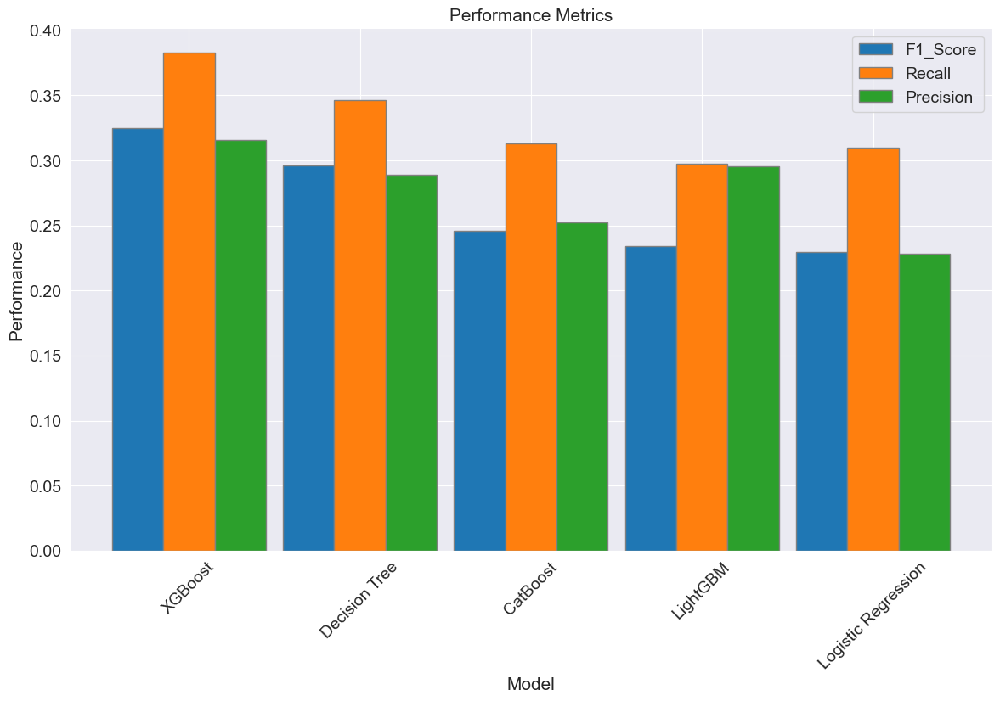

In [159]:
plt.figure(figsize=(14, 8))

barWidth = 0.3

r1 = np.arange(len(sorted_results['Model']))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

plt.bar(r1, sorted_results['F1_Score'], width=barWidth, edgecolor='grey', label='F1_Score')
plt.bar(r2, sorted_results['Recall'], width=barWidth, edgecolor='grey', label='Recall')
plt.bar(r3, sorted_results['Precision'], width=barWidth, edgecolor='grey', label='Precision')

plt.xlabel('Model', fontsize=15)
plt.ylabel('Performance', fontsize=15)
plt.title('Performance Metrics', fontsize=15)
plt.xticks([r + barWidth for r in range(len(sorted_results['Model']))], sorted_results['Model'], rotation=45)

plt.legend()

plt.show()

## 6. Применение модели на las-файлах

In [207]:
from cegal.welltools.wells import Well

In [215]:
force_well = Well(filename='./16_7-6.las', path=None)

In [216]:
pd.DataFrame(force_well.df())

,FORCE_2020_LITHOFACIES_CONFIDENCE,FORCE_2020_LITHOFACIES_LITHOLOGY,CALI,BS,DCAL,ROP,RDEP,RSHA,RMED,RMIC,...,NPHI,PEF,GR,RHOB,DRHO,SGR,DEPTH_MD,X_LOC,Y_LOC,Z_LOC
DEPT,,,,,,,,,,,,,,,,,,,,,
103.0224,NaN,NaN,NaN,36.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
103.1744,NaN,NaN,NaN,36.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
103.3264,NaN,NaN,NaN,36.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
103.4784,NaN,NaN,NaN,36.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
103.6304,NaN,NaN,NaN,36.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2732.4704,NaN,NaN,NaN,12.250001,-0.531900,NaN,NaN,NaN,NaN,NaN,...,NaN,3.4532,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2732.6224,NaN,NaN,NaN,12.250001,-0.531900,NaN,NaN,NaN,NaN,NaN,...,NaN,3.4532,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2732.7744,NaN,NaN,NaN,12.250001,-0.531900,NaN,NaN,NaN,NaN,NaN,...,NaN,3.4532,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [217]:
test_well = pd.DataFrame(force_well.df())

In [218]:
# Преобразуйте их с помощью scaler.transform
test_well[features] = scaler.transform(test_well[features])

In [219]:
features

['DEPTH_MD',
 'CALI',
 'RSHA',
 'RMED',
 'RDEP',
 'RHOB',
 'GR',
 'PEF',
 'DTC',
 'BS',
 'NPHI',
 'SP']

In [220]:
CB_test_well = catboost_model.predict(test_well[features])

In [227]:
test_well['Litology'] = CB_test_well

In [234]:
test_well['Litology'].map(lithology_keys)

DEPTH_MD
NaN    30000
NaN    30000
NaN    30000
NaN    30000
NaN    30000
       ...  
NaN    30000
NaN    30000
NaN    30000
NaN    30000
NaN    30000
Name: Litology, Length: 17304, dtype: int64

In [221]:
test_well.set_index('DEPTH_MD', inplace=True)

In [222]:
from cegal.welltools.plotting import CegalWellPlotter as cwp

In [231]:
cwp.plot_logs(df=test_well, 
              logs=['CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB'], 
              log_scale_logs=['RMED', 'RDEP'])

In [224]:
lithology_colors = {
    'Sandstone': '#FFD700',
    'Sandstone/Shale': '#7FFF00',
    'Shale': '#006400',
    'Marl': '#8B4513',
    'Dolomite': '#A0522D',
    'Limestone': '#00FFFF',
    'Chalk': '#F0E68C',
    'Halite': '#FF0000',
    'Anhydrite': '#DAA520',
    'Tuff': '#FF1493',
    'Coal': '#000000',
    'Basement': '#8A2BE2'
}

lithology_combined = {lithology_keys[key]: (key, lithology_colors[key]) for key in lithology_keys}


{30000: ('Sandstone', '#FFD700'), 65030: ('Sandstone/Shale', '#7FFF00'), 65000: ('Shale', '#006400'), 80000: ('Marl', '#8B4513'), 74000: ('Dolomite', '#A0522D'), 70000: ('Limestone', '#00FFFF'), 70032: ('Chalk', '#F0E68C'), 88000: ('Halite', '#FF0000'), 86000: ('Anhydrite', '#DAA520'), 99000: ('Tuff', '#FF1493'), 90000: ('Coal', '#000000'), 93000: ('Basement', '#8A2BE2')}


In [235]:
lithology_dict = {
    1.0: ('sand', '#e6e208'),
    2.0: ('shale', '#0b8102'),
    3.0: ('lst', 'Orange'),
}

cwp.plot_logs(df=test_well, 
              logs=['CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB'], 
              log_scale_logs=['RMED', 'RDEP'],
              lithology_logs='Litology', 
              lithology_description=lithology_combined)

UFuncTypeError: ufunc 'multiply' did not contain a loop with signature matching types (dtype('float64'), dtype('<U9')) -> None